In [1]:
# Importing all the required Libraries

import pandas as pd
import numpy as np
import math
from scipy.stats.stats import pearsonr 

try:
    import collections 
except:
    !pip install collections
    import collections

from collections import defaultdict


try:
    import nltk 
except:
    !pip install nltk
    import nltk

try:
    import re 
except:
    !pip install re
    import re
    

from collections import Counter
from nltk import tokenize
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
nltk.download('stopwords')
from itertools import chain
import scipy.stats as stats
import random
import statistics
from scipy.stats import ttest_ind

try:
    from wordcloud import WordCloud
except:
    !pip install wordcloud
    from wordcloud import WordCloud 

from datetime import datetime

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.cluster.hierarchy as sch
from scipy import zeros
import warnings
warnings.filterwarnings("ignore")

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.datasets import load_iris
from sklearn.cluster import AgglomerativeClustering

try:
    import operator # for sorting dictionaries
except:
    !pip install operator
    import operator
    
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hpate\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# Setting max display length in our IPython Notebook
pd.set_option('display.max_rows', 5)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

# Web Scrapping notebook for Indeed website
### We will be web scrapping indeed to extract skills from job description used in the field of data science

Web Scrapping library being used Selenium, beautifulsoup

# LinkedIn Web Scrapping

Will be scraping infromation about 'Data Analyst' positions in 'Canada'. 

- Date
- Title
- Company Name
- Location
- Job Description
- Job Level
- Job Type
- Function
- Industry
- Job ID


Open this link in a chrome incognito mode.
Specify to job title and location in the search bar.
Copy and pase sortBy=DD& after location=(will show your searched location) in the weblink.
Copy the final link and replace url variable with the new url in code block 2.
To search data for more jobs, specify the numner of jobs (in multiple of 25 like 50 or 75 or 100 and so on) against variable called 'no_of_jobs' in code block 2.
After all the above the steps are done, run the code
For this example, we will only look for 25 recent jobs. I hope you enjoy this.

# Coursera Web Scrapping

## Importing Indeed and Linkedin Web Scrapped Data

**NOTE: To avoid inconsistency in our result and discussion in this notebook. Web Scrapping Notebook will be provided separately and the Web Scrapped Data will be imported into this notebook.**

In [3]:
df_Indeed = pd.read_excel('Project_Indeed_Web_Scrappers.xlsx', index_col=None, header=0)  
df_LinkedIn = pd.read_csv('LinkedIn Job Data.csv', index_col=None, header=0)  

In [4]:
# Creating a Dictionary skill list for arranging skills in job description in a list

skills_keywords_dict = {
        # Programming skills
        'Tableau': ['Tableau','tableau'],
        'Power BI': [ 'power bi', 'Power BI'],
        'looker': ['looker', 'Looker'],
        'Excel': ['Excel', 'VBA'],
        'Python': ['Python'],
        'R': [' R ', ' R,',  ' R/', '/R '], # 'R' surrounded by spaces and signs
        'Java': ['Java', 'JVM'],
        'Scala': ['Scala','scala'],
        'C/C++': ['C/C++', 'C++', ' C ','C plus plus'],   # 'C' surrounded by spaces and signs
        'PostgreSQL': ['Postgres', 'PostgreSQL', 'Postgre SQL'],
        'MATLAB': ['MATLAB'],
        'SAS': ['SAS'],
        'SQL/databases': ['SQL', 'databases', 'rdbms','Database Management Systems','DBMS'],
        'MongoDB': ['MongoDB', 'mongodb', 'mongo db'],
        'NoSQL':['nosql','NoSQL'],
        'Oracle':['Oracle'],
        'SPSS': ['SPSS'],
        'Javescript': ['Javescript', 'js','React', 'Vue', 'Angular'],
        'Stata': ['Stata'],
        
        # Machine Learning
        'Machine Learning': ['Machine Learning','ML','AI','Artificial Intelligence',
                             "AI/ML",'ML/AI' 'scikit learn','xgboost', 'random forest','Decision Trees','Ensemble',
                             'regression', 'clustering', 'Attention Models','Monte Carlo','Supervised Learning',
                            'Unsupervised Learning'],
        'Computer Vision': ['Convolutional Neural Network','Computer Vision', 'Perception', 
                            'OpenCV','computer image analysis', 'Image Processing'],
        'Data Mining/Analytics': ['Data Mining', 'DM', 'Analytics','Image Segmentation','Image-to-Image Translation','PCA'],
        'NLP': ['Natural Language Processing', 'NLP','Text Analysis','Natural Language Toolkit',
                'Sentiment Analysis','Sentiment Similarity'],
        'Visualisation': ['Visualisation', 'Visualization','ggplot2','plotly', 'seaborn'],
        'GAN' : ["GAN ", 'Generative Adversarial Network'],
        'Support Vector Machines': ['SVM', 'Support vector machines'],
        'Neural Networks': ['Neural Networks', 'MLP', 'CNN', 'Tensorflow', 'Keras', 'Theano', 'DNN', 'Deep Neural Network'],
        'Sequence Series': ['Time Series Analysis', 'Sequence Aanlysis'],
        'Reinforcement Learning': ['Q-learning', 'fuzzy learning', 'reinforcement learning'],
        
        #Big Data
        'Big Data': ['Big Data', 'Spark', 'kafka', 'Hive','beam', 'Hadoop', 'MapReduce', 'Hbase',
                     'Coudera', 'Hortonworks','hadoop','mapreduce','spark','hive','kafka','snowflake', 
                     'databricks', 'pig', 'pyspark', 'zookeeper','ambari','Databricks', 'pyspark'],
        'Apache': ['Apache Spark','Apache Hadoop', 'Apache Impala',' Google Cloud Platform'],
        'Ruby': ['Ruby'],
        'Perl': ['Perl'],
        
        # Cloud Computing
        'AWS Cloud': ['AWS', 'AWS Sagemaker', 'amazon web service'],
        'IBM': ['IBM', 'IBM Watson', 'IBM cloud','IBM Cognos Analytics','Watson'],
        'Azure': ['Azure', 'Microsoft Cloud', 'Azure LUIS', 'LUIS','Auto ML'],
        'Google Cloud': ['Google Cloud','Google Analytics',],
        
        # Mathematics
        'Probability': ['probablity', 'probability theory'],
        'Algebra': ['Algebra'],
        'Statistics' :  ['Statistics','Descriptive Statistics','Optimization'],
        'Mathematics': ['Mathematics','Calculus'],
        
        # Web
        'GCP': ['GCP'],
        'Json': ['Json'],
        'xml': ['xml'],
        'Web': ['API', 'html', 'css', 'frontend'],
        
        # Software
        'Git':['GitHub', 'Git ', 'version control'],
        'Linux': ['Linux', 'bash','Ubuntu','Boss','shell'],
        
        # ELective Skills (Business skills)
        'Operations': ['Operations research', 'logistic'],
        'Supply Chain': ['Supply Chain', 'Supply chain Management', 'Green Belt','Yellow Belt','Black Belt'],
        'Finance': ['Accounting', 'Banking','Stock','Investment'],
        'BlockChain': ['Blockchain', 'Cryptocurrency'],
        'Cyber Security': ['Cyber Security', 'Penetration Testing','Cloud Computing Security'],
        'Risk Management': ['Crisis Management', 'Risk Management'],
        'Marketing': ['Marketing','SEO','Digital Marketing'],
    
        
        # Phone Development
        'Mobile Development': ['Android', 'Android Studio','Mobile Application Development','IOS','Swift','Mobile Development'],
        
        # Management and Soft Skills
        'Analytics': ['Data Analytics','Business Analytics'],
        'Communication' : ['Communication', 'Presentation','Storytelling'],
        'Management' : ['Management', 'Data management'],
        'DevOps': ['DevOps', 'TDD', 'test-driven'],
        'agile' : ['agile'],
        'Scrum': ['Scrum Master', 'Scrum'],
        'SDLC' : ['SDLC', 'sdlc', 'software development', 'lifecycle'],
        'Decision Making' : ['decision making', 'decision analysis'],
        'Problem Solving': ['problem solving'],
        'Team building': ['Team leadership', 'team building'],
        'Project_Management': ['project management'],
        'Leadership': ['leadership'],
        'Consulting': ['consulting', 'consultant', 'active listening'],
        'Writing': ['Reports'],
        'Critical Thinking': ['Critical Thinking', 'Critical', "Decision Making"]
    }

In [5]:
df_Indeed.head(2)

Unnamed: 0                                                 Title  \
0  0.0         Data Scientist – Intact Lab – Hong Kong Science Park   
1  1.0         Data Science Analyst,Customer Analytics/CRM            

                    Company      Location  \
0  Intact                    Waterloo, ON   
1  Loblaw Companies Limited  Waterloo, ON   

                                                                            Link  \
0  https://ca.indeed.com/rc/clk?jk=cc1c77fbb9ec84dd&fccid=be7195d2ebb48351&vjs=3   
1  https://ca.indeed.com/rc/clk?jk=977c2bf90c4b43f3&fccid=bc30630cfcc120d4&vjs=3   

  Review Salary  \
0  3.8    None    
1  3.5    None    

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [6]:
df_LinkedIn.head(1)

,Job ID,Date,Company Name,Post,Location,Description,Level,Type,Industry,Function
0,2263288909,11/1/20,Pollard Banknote Limited,Business Analyst,"Winnipeg, Manitoba, Canada","We’re looking for a self-motivated and passionate individual to join the fast-paced environment as a Business Analyst with the Digital Solutions Team at Pollard Banknote. In this role, you will be responsible for working with many different internal and external teams to gather requirements and manage the effective planning and lifecycle management of digital solutions for the lottery industry. As a Business Analyst, you will maintain product backlog, create a product roadmap, direct the project team and assist in systems analysis. Product planning responsibilities include awareness and analysis of systems and operational needs and translates them to product requirements and roadmap, and ensure the team has the tools and the expertise to deliver the product. Pollard Banknote offers a challenging, team-oriented environment, competitive compensation, profit sharing program, company pension and opportunities for professional development. Interested candidates are encouraged to submit a cover letter outlining fit and salary expectations along with a résumé. Pollard Banknote Limited is an equal opportunity employer, committed to maintaining a diverse workforce. We thank all candidates that apply, however only those selected for an interview will be contacted. Employment is contingent upon a satisfactory response from a Criminal Record Search. Pollard Banknote is a leading lottery partner to more than 60 lotteries worldwide, providing high quality instant ticket products, licensed games, Schafer Systems and Fastrak retail merchandising solutions, and a full suite of digital offerings, ranging from game apps to comprehensive player engagement and iLottery solutions, including strategic marketing and management services. The company is a proven innovator and has decades of experience helping lotteries to maximize player engagement, sales, and proceeds for good causes. Pollard Banknote also provides pull-tab tickets, bingo paper, and its Diamond Game and Oasis-branded electronic ticket machines to charitable and other gaming markets in North America. Established in 1907, Pollard Banknote is owned approximately 67.5% by the Pollard family and 32.5% by public shareholders, and is publicly traded on the TSX (PBL). For more information, please visit Pollard Banknote’s website at www.pollardbanknote.com. Show more",Associate,Full-time,Information Technology and ServicesComputer SoftwareFinancial Services,NaN


Since the data was scrapped from Indeed and Kaggle. We will be joining the data together. Additionally we will be only looking at the Title and Description as our main focus as those give us the main idea at our target courses to answer questions such as:
Q: How many internships are offered each year
Q: What programming languages are in demand
Q: What are the important skills that the current market demands
Q: What kind of business understanding the market is looking for
Q: What are the key skills that a typical jobs required together.

These questions will help us in designing the Data Science program in order to make the UofT program competitive in the given market.

In [7]:
# Extracting the titles and decription column from linkedIn and Indeed data
df_scrapped1 = df_Indeed[['Title', 'Description']]
print(df_scrapped1.count())
df_scrapped2 = df_LinkedIn[['Post','Description']]
print(df_scrapped2.count())
df_scrapped2.rename(columns = {'Post': 'Title'}, inplace = True)

Title          3902
Description    3902
dtype: int64
Post           362
Description    362
dtype: int64


In [8]:
# Combining the extracted data frame into one data frame
df_scrapped = pd.concat([df_scrapped1, df_scrapped2], axis=0)
df_scrapped.count()

Title          4264
Description    4264
dtype: int64

In [9]:
# Due to automated process some of the web scrapping did not extract all the description
# Deleting any duplicates, Null and any rows containing "None" in description
df_scrapped['Description'].dropna(axis = 0)
df_scrapped['Description'].drop_duplicates()
df_scrapped = df_scrapped[df_scrapped['Description'] != 'None']
df_scrapped.count()

Title          1674
Description    1674
dtype: int64

In [10]:
# Arranging the dataframe df_scrapped into a one-hot encoding data where if the skill is present in the
# description we will put one in under the skill column else we will put zero

skill_dataframe_dict = {}

a_string = "abc !? 123-"
for index, row in df_scrapped.iterrows():
    
    title = str(row['Title'])
    description = str(row['Description'])
    description = description.lower()
    #print(description)
    #break
    result = {} 
    for skill_category, skills in skills_keywords_dict.items():
        
        # variable used to store results of the intermediate check (loop below)
        category_found = 0   
               
        # loop over all skills in the sublist of 'skills_keywords_dict'
        for skill in skills:
            skill = skill.lower()
                    
            # if skill from the sublist is found, set 'category_found' to 1
            if skill.lower() in description.lower():
                category_found = 1
            if description.find(skill) != -1:
                category_found = 1
 
                     
            
            # skill set to 1 if found, 0 if not, in 'results_dict'
            result[skill_category] = category_found 
    skill_dataframe_dict[title] = result

        
    
skills_encoded_df = pd.DataFrame(skill_dataframe_dict).T.reset_index()
skills_encoded_df.head(5)

,index,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
0,Data Scientist – Intact Lab – Hong Kong Science Park,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1,"Data Science Analyst,Customer Analytics/CRM",0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0
2,Research Data Analyst/Statistician Musculoskeletal Health Re...,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0
3,Data Scientist Intern,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
4,Manager Data Analytics,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1


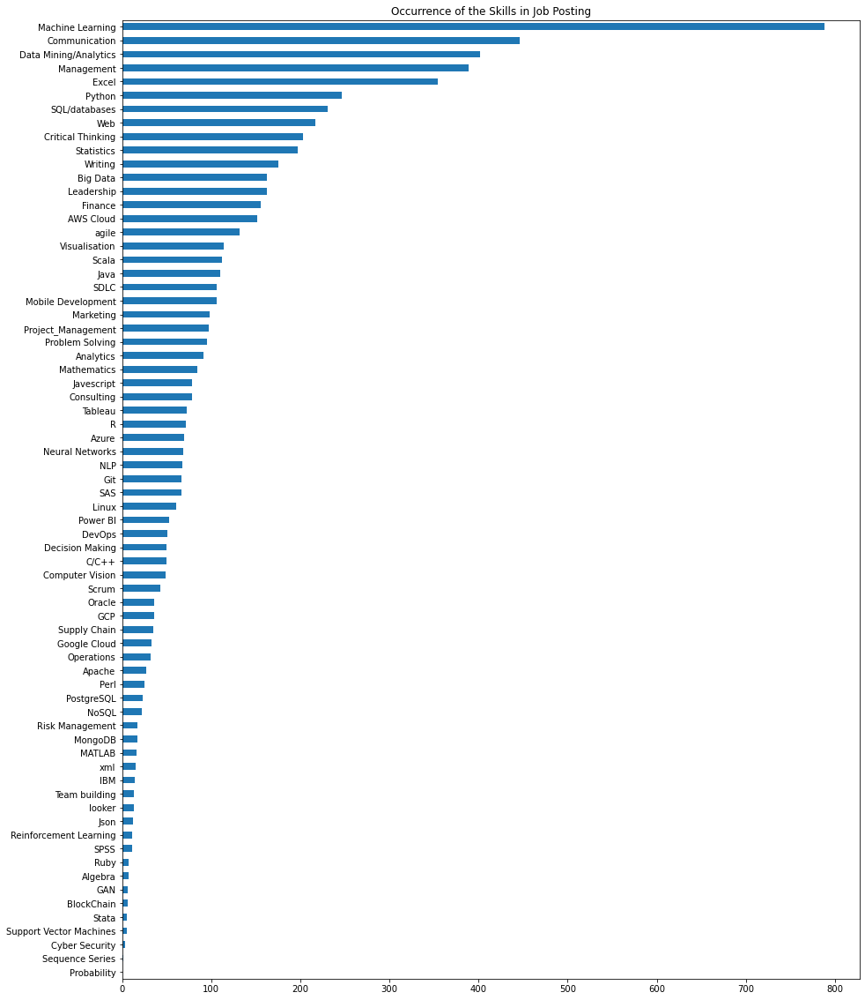

In [11]:
skillsCount = skills_encoded_df.iloc[: , 1:].sum()
plot = skillsCount.sort_values().plot.barh(title = 'Occurrence of the Skills in Job Posting', figsize = (15, 20))

# Exploratory Data Analysis on  Web Scrapped Data

In [12]:
def count_skill(dict, df, col, skills):
    for skill in skills_list_combined:
        count = df.text.str.contains(skill).sum()
        value = 0
        if skill in dict.keys():
            value = dict[skill]
        dict[skill] = value+count
    return dict




# filtering and tokenizing words

def transfer_text(df, col, newcol):
    stop = stopwords.words('english')
    print(len(df[col]))
    for i in range(0, len(df)):
        try:
            text = [word.lower() for word 
                        in tokenize.regexp.regexp_tokenize(str(df.loc[i, col]), pattern='\w+')
                        if word.lower() not in stop and not word.isdigit()]
            df.loc[i, newcol] = ' '.join(word for word in text)
            df.loc[i, newcol].replace('google cloud services', 'gcs').replace('amazon web services', 'aws').replace('nueral networks', 'nueral network')  
        except:
            pass
    return df

In [13]:
# Technical Skills to be reviewed for out EDA with the help of List for Major Skills

cloud = ['GCP', 'AWS Cloud', 'Azure', 'IBM']

language = ['Python', 'R', 'Tableau', 'Excel', 'Java', 'PostgreSQL', 'SAS', 'C/C++', 'MATLAB', 
            'Scala','SQL/databases','MongoDB','NoSQL','Oracle','SPSS','Javescript','Stata'] 

ml = ['Machine Learning', 'Computer Vision', 'Data Mining/Analytics', 'NLP', 'Visualisation', 'GAN', 
      'Support Vector Machines', 'Neural Networks', 'Sequence Series','Reinforcement Learning']

Mathematics = ['Probability', 'Algebra', 'Statistics', 'Mathematics']

web = ['GCP', 'Json', 'xml', 'Web']

bigdata=['Big Data','Apache','Ruby','Perl']

extra_skills = ['Git','Linux']

elective =['Operations','Supply Chain','Finance','BlockChain','Cyber Security','Risk Management','Marketing']

app = ['Mobile Development']

management =   ['Analytics','Communication','Management','DevOps','agile' ,'Scrum','SDLC',
                'Decision Making','Problem Solving','Team building','Project_Management',
                'Leadership','Consulting','Writing','Critical Thinking']

skills_list_combined = cloud + language + ml + Mathematics + web + bigdata + extra_skills + management + app + elective

In [14]:
# Extracting all the titles in the job posting
titles = skills_encoded_df['index'].unique()
print(len(titles))

853


In [15]:
# Creating a dataframe with a total of all the skills found in the scrapped data
skills_list_df = pd.DataFrame(skills_encoded_df.iloc[: , 1:].sum())
skills_list_df.columns = ['count']
skills_list_df = skills_list_df.transpose()
skills_list_df.head()

,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
count,73,53,13,354,247,72,110,112,50,23,16,67,231,17,22,36,11,79,5,788,49,402,68,114,6,5,69,1,11,163,27,7,25,152,14,70,33,0,7,197,84,36,12,15,217,67,61,32,35,156,6,3,17,98,106,91,446,389,51,132,43,106,50,95,13,97,163,79,175,203


In [16]:
#skills_list_df_sorted = skills_list_df.iloc[0,:].sort_values(axis=0, ascending=False)
#skills_list_df_sorted.head()

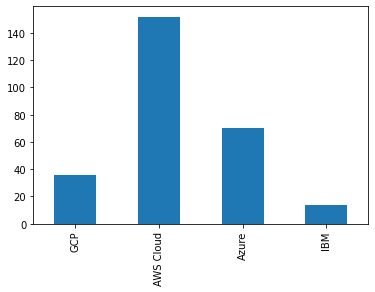

In [17]:
# EDA for Cloud
df_cloud = skills_list_df[cloud].iloc[0,:]
plot = df_cloud.plot.bar()

Looking at the cloud services it can be seen that Amazon Web Services (AWS) is one of the popular choice in jobs. The next major cloud service in demand is Azure

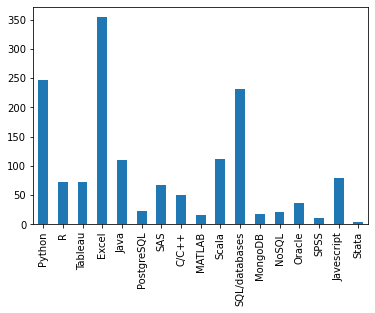

In [18]:
# EDA for different programming languages
df_language = skills_list_df[language].iloc[0,:]
plot = df_language.plot.bar()

Looking at the bar graph it is evident that the three major programming skills that are required for many jobs are Python, SQL and Excel. Since the market is seeking these as the leading language skills can be highly valuable for entry level positions for new graduates.

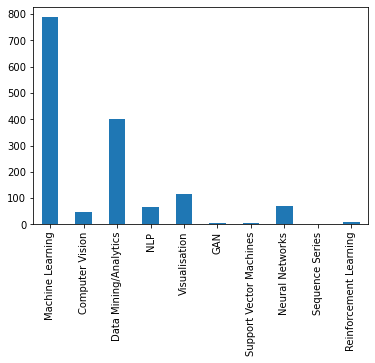

In [19]:
# EDA for for Machine Learning Fields
df_ml = skills_list_df[ml].iloc[0,:]
plot = df_ml.plot.bar()

We can see that Machine learning is a very popular in demand skill that a lot of employers in the market are looking for.
Data Analytics and Mining is the second most popular choice for job skill. Hence having these included in the final core choice will be a good decision. <br>

Additionally, we can see that Computer Vision, NLP and Neural Networks are a popular choices. Hence combining them into one course under the name "Deep Learning" will be a good idea.


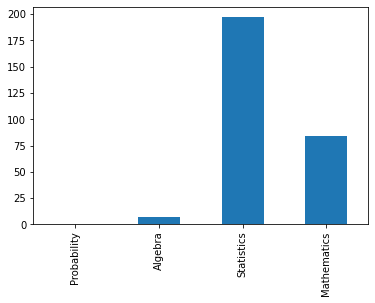

In [20]:
# EDA for Mathematics
df_Mathematics = skills_list_df[Mathematics].iloc[0,:]
plot = df_Mathematics.plot.bar()

Fromt he the above plot it can be Seen that having a strong Statistical and Mathematical background is an essential requriement. Designing a course that teach Statistics and Mathematics required in the field of Mathematics will be an essential requirement. 

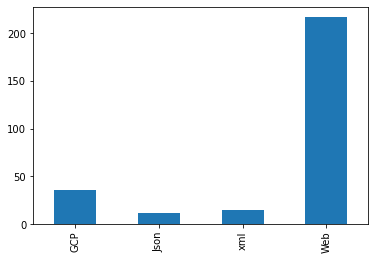

In [21]:
# EDA for Web
df_web = skills_list_df[web].iloc[0,:]
plot = df_web.plot.bar()

We can see that web development skills are also in demand, however, this stream is not directly linked with the field of Data Science. However, having knowledge of web is important. Sub skills listed in our skills dictionary defined above look for job descriptions with HTML, API,CSS and frontend knowledge as these can help a data scientist gather more data. 

As we are moving towards an internet society these skills are important in data collection and implementing models in production. Having a component of this in our skills will help achieve that goal.

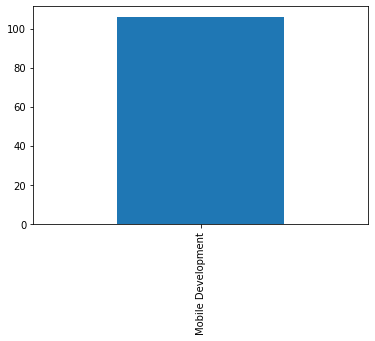

In [22]:
# EDA for App
df_app = skills_list_df[app].iloc[0,:]
plot = df_app.plot.bar()

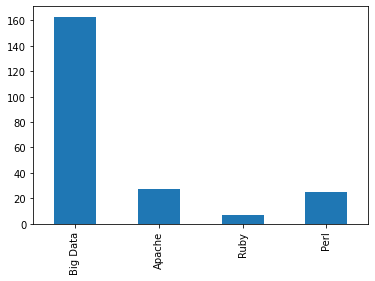

In [23]:
# EDA for Big Data
df_bigdata = skills_list_df[bigdata].iloc[0,:]
plot = df_bigdata.plot.bar()

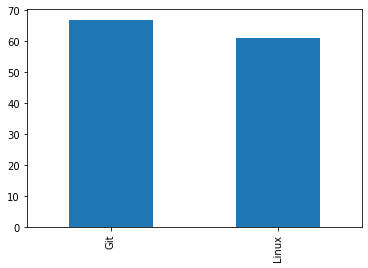

In [24]:
# EDA for Extra Skill
df_extra_skills = skills_list_df[extra_skills].iloc[0,:]
plot = df_extra_skills.plot.bar()

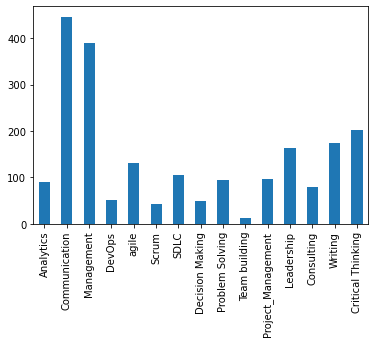

In [25]:
# EDA for Management Skills
df_management = skills_list_df[management].iloc[0,:]
plot = df_management.plot.bar()

# Extracting Sub Dataframes form the complete skill dataframe

We will look at three categories of jobs

1: Technical Roles
2: Upper Management and Senior Roles
3: Internship and Summer jobs

In [26]:
# Extracting Dataframe for Managers
manager_roles = ['manager' ,'management' , 'senior']
df_manager = skills_encoded_df[ skills_encoded_df['index'].astype(str).str.lower().str.contains('|'.join(manager_roles))]

# Extracting all Management titles/roles
management_roles = df_manager['index'].tolist()


print(df_manager.shape)
df_manager.head(2)

(161, 71)


,index,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
4,Manager Data Analytics,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1
8,Senior Data Scientist - Forecasting,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [27]:
#extracting Dataframe for Internship and Summer Jobs
intern_roles = ['intern' ,'internship' , 'co-op','coop','student','summer']
df_intern = skills_encoded_df[ skills_encoded_df['index'].astype(str).str.lower().str.contains('|'.join(intern_roles))]

# Extracting all intern and summer roles/titles
intern_roles = df_intern['index'].tolist()

print(df_intern.shape)
df_intern.head(2)

(54, 71)


,index,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
3,Data Scientist Intern,1,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
12,Data Scientist Intern (4 months),0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,1,0,0,0,0,0,1,1,0,0,1,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0


In [28]:
non_tech_roles = manager_roles+intern_roles
df_technical = skills_encoded_df[~skills_encoded_df['index'].isin(non_tech_roles)]

print(df_technical.shape)
df_technical.head(2)

(799, 71)


,index,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
0,Data Scientist – Intact Lab – Hong Kong Science Park,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1,"Data Science Analyst,Customer Analytics/CRM",0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0


# Hierachical Clustering on Jobs for Management, Technical and Internship roles 

## Management Jobs

In [29]:
# empty matrix is fill
num_skills = len(df_manager.columns)
D_managers = zeros([num_skills, num_skills])

# Find all element wise temp differences
for i in range(num_skills):
    for j in range(num_skills):
        mask1 = df_manager.iloc[:, i] == 1
        mask2 = df_manager.iloc[:, j] == 1
        D_managers[i,j] = len(df_manager[mask1 & mask2])

In [30]:
Y = sch.linkage(D_managers, method='centroid')

[]

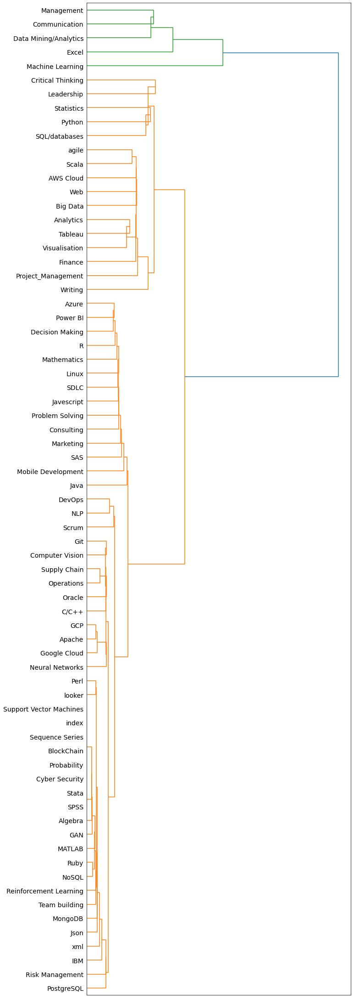

In [31]:
fig = plt.figure(figsize=(20,50))
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
skills_list = df_manager.columns.values

Z1 = sch.dendrogram(Y, orientation='right')
labels = skills_list[Z1['leaves']]
                     
ax1.set_xticks([])
ax1.set_yticklabels(labels,fontsize=14)

plt.plot() # supress prints

## Intern Jobs

In [32]:
# empty matrix is fill
num_skills = len(df_intern.columns)
D_interns = zeros([num_skills, num_skills])

# Find all element wise temp differences
for i in range(num_skills):
    for j in range(num_skills):
        mask1 = df_intern.iloc[:, i] == 1
        mask2 = df_intern.iloc[:, j] == 1
        D_interns[i,j] = len(df_intern[mask1 & mask2])

In [33]:
Y2 = sch.linkage(D_interns, method='centroid')

[]

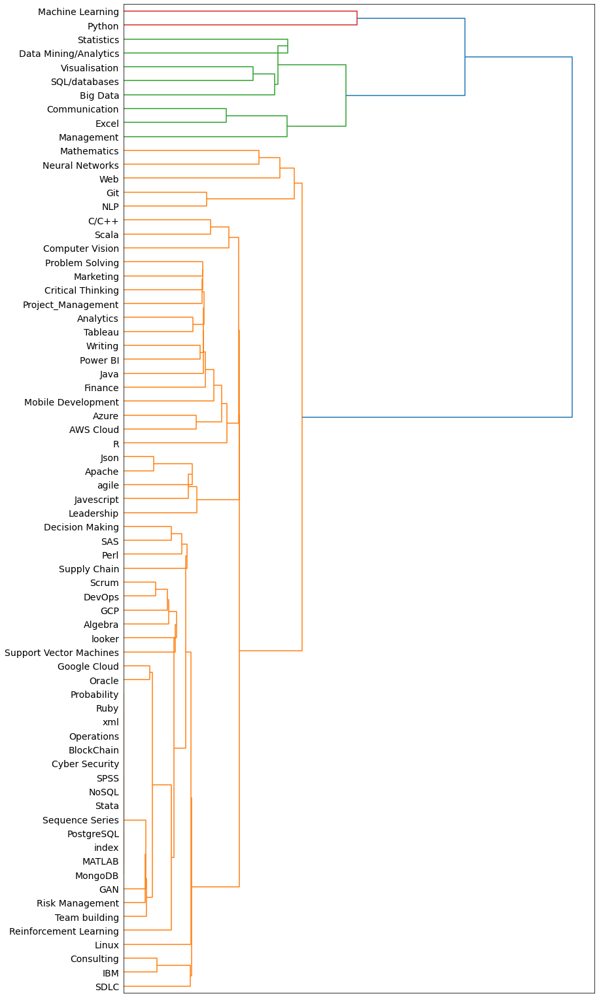

In [34]:
fig = plt.figure(figsize=(25,35))
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
skills_list2 = df_intern.columns.values

Z1 = sch.dendrogram(Y2, orientation='right')
labels = skills_list2[Z1['leaves']]
                     
ax1.set_xticks([])
ax1.set_yticklabels(labels,fontsize=14)

plt.plot() # supress prints

## Technical Jobs

In [35]:
# empty matrix is fill
num_skills = len(df_technical.columns)
D_technical = zeros([num_skills, num_skills])

# Find all element wise temp differences
for i in range(num_skills):
    for j in range(num_skills):
        mask1 = df_technical.iloc[:, i] == 1
        mask2 = df_technical.iloc[:, j] == 1
        D_technical[i,j] = len(df_technical[mask1 & mask2])

In [36]:
Y3 = sch.linkage(D_technical, method='centroid')

[]

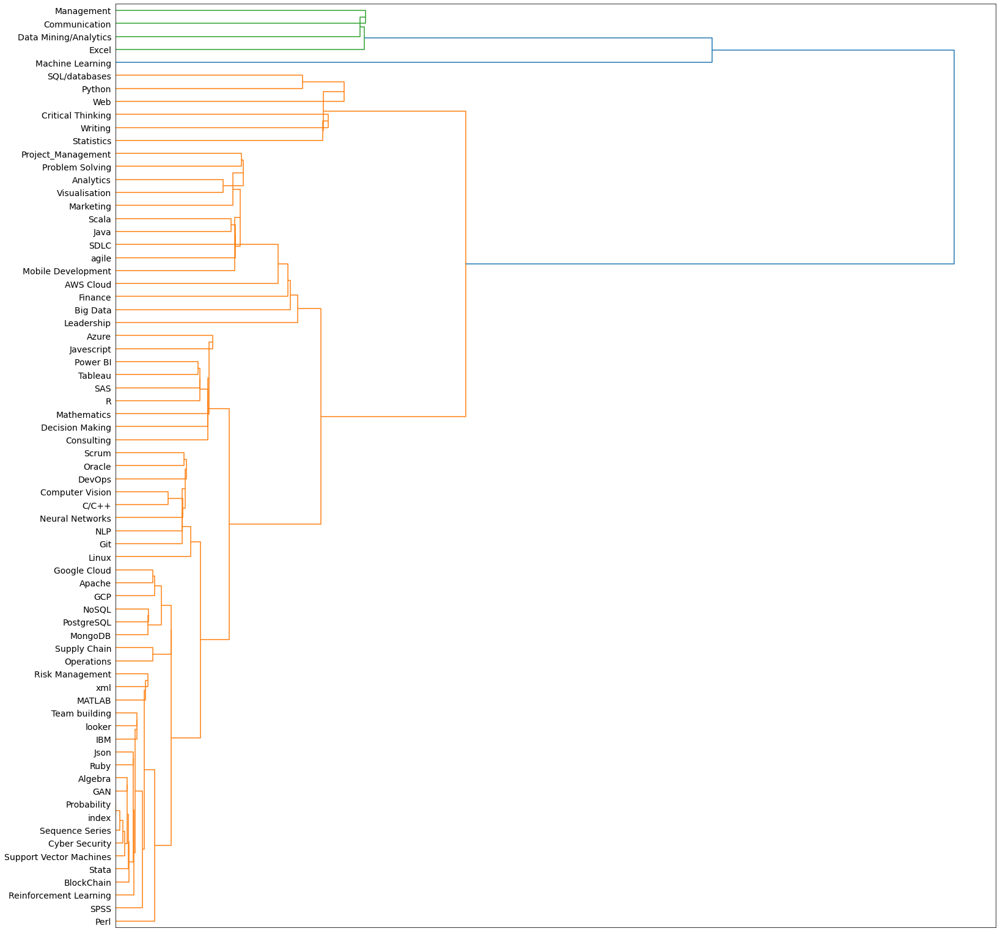

In [37]:
fig = plt.figure(figsize=(50,35))
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
skills_list3 = df_technical.columns.values

Z1 = sch.dendrogram(Y3, orientation='right')
labels = skills_list3[Z1['leaves']]
                     
ax1.set_xticks([])
ax1.set_yticklabels(labels,fontsize=14)

plt.plot() # supress prints

# Hierachical Clustering for skills on all the web scrapped jobs

In [38]:
skills_encoded_df.head(2)

,index,Tableau,Power BI,looker,Excel,Python,R,Java,Scala,C/C++,PostgreSQL,MATLAB,SAS,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Big Data,Apache,Ruby,Perl,AWS Cloud,IBM,Azure,Google Cloud,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Git,Linux,Operations,Supply Chain,Finance,BlockChain,Cyber Security,Risk Management,Marketing,Mobile Development,Analytics,Communication,Management,DevOps,agile,Scrum,SDLC,Decision Making,Problem Solving,Team building,Project_Management,Leadership,Consulting,Writing,Critical Thinking
0,Data Scientist – Intact Lab – Hong Kong Science Park,0,0,0,1,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1,"Data Science Analyst,Customer Analytics/CRM",0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0


In [39]:
# re-arranging the dataframe: setting the job titles as index
skills_encoded_df.set_index('index', inplace = True)

In [40]:
# Uncomment the line below to save the extracted one-hot encoded data frame as an excel file

#skills_encoded_df.to_excel('Skill_Encoded.xlsx')

In [41]:
#Extracting list of all the skills saved as a columns

skills_columns = skills_encoded_df.columns
print(len(skills_columns))
skills_columns

70


Index(['Tableau', 'Power BI', 'looker', 'Excel', 'Python', 'R', 'Java',
       'Scala', 'C/C++', 'PostgreSQL', 'MATLAB', 'SAS', 'SQL/databases',
       'MongoDB', 'NoSQL', 'Oracle', 'SPSS', 'Javescript', 'Stata',
       'Machine Learning', 'Computer Vision', 'Data Mining/Analytics', 'NLP',
       'Visualisation', 'GAN', 'Support Vector Machines', 'Neural Networks',
       'Sequence Series', 'Reinforcement Learning', 'Big Data', 'Apache',
       'Ruby', 'Perl', 'AWS Cloud', 'IBM', 'Azure', 'Google Cloud',
       'Probability', 'Algebra', 'Statistics', 'Mathematics', 'GCP', 'Json',
       'xml', 'Web', 'Git', 'Linux', 'Operations', 'Supply Chain', 'Finance',
       'BlockChain', 'Cyber Security', 'Risk Management', 'Marketing',
       'Mobile Development', 'Analytics', 'Communication', 'Management',
       'DevOps', 'agile', 'Scrum', 'SDLC', 'Decision Making',
       'Problem Solving', 'Team building', 'Project_Management', 'Leadership',
       'Consulting', 'Writing', 'Critical Thinking

In [42]:
# empty matrix is fill
num_skills = len(skills_encoded_df.columns)
D_skills_encoded = zeros([num_skills, num_skills])

# Find all element wise temp differences
for i in range(num_skills):
    for j in range(num_skills):
        mask1 = skills_encoded_df.iloc[:, i] == 1
        mask2 = skills_encoded_df.iloc[:, j] == 1
        D_skills_encoded[i,j] = len(skills_encoded_df[mask1 & mask2])

In [43]:
Y4 = sch.linkage(D_skills_encoded, method='centroid')

[]

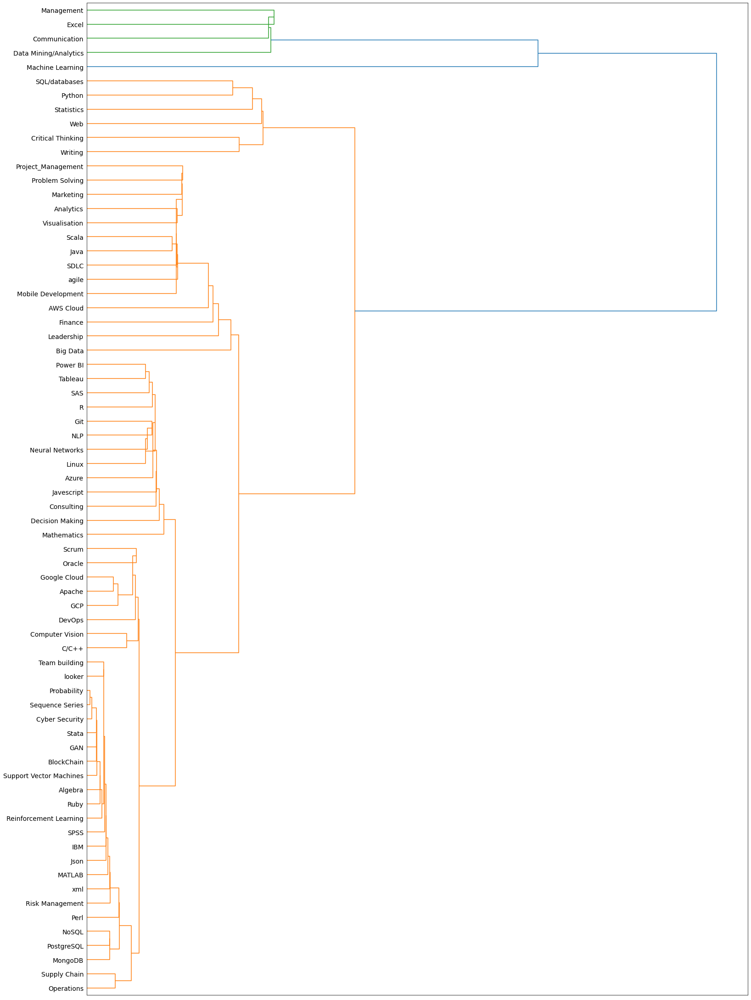

In [44]:
fig = plt.figure(figsize=(50,50))
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
skills_list4 = skills_encoded_df.columns.values

Z1 = sch.dendrogram(Y4, orientation='right')
labels = skills_list4[Z1['leaves']]
                     
ax1.set_xticks([])
ax1.set_yticklabels(labels,fontsize=14)

plt.plot() # supress prints

We will divide the extracted skill data frame based on jobs

# Heirarchical Clustering Based on Technical skills

## Technical Skills HC

In [45]:
# Getting a technical skill only dataframe
df_technical_skills = skills_encoded_df [cloud + language + ml + Mathematics + web + bigdata + app + extra_skills]
df_technical_skills.head(2)

,GCP,AWS Cloud,Azure,IBM,Python,R,Tableau,Excel,Java,PostgreSQL,SAS,C/C++,MATLAB,Scala,SQL/databases,MongoDB,NoSQL,Oracle,SPSS,Javescript,Stata,Machine Learning,Computer Vision,Data Mining/Analytics,NLP,Visualisation,GAN,Support Vector Machines,Neural Networks,Sequence Series,Reinforcement Learning,Probability,Algebra,Statistics,Mathematics,GCP,Json,xml,Web,Big Data,Apache,Ruby,Perl,Mobile Development,Git,Linux
index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Data Scientist – Intact Lab – Hong Kong Science Park,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,1,0,0,1,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0
"Data Science Analyst,Customer Analytics/CRM",1,1,1,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,1,1,0,0,0,0,0


Visualization

In [46]:
# empty matrix is fill
num_skills = len(df_technical_skills.columns)
D_tech_skills = zeros([num_skills, num_skills])

# Find all element wise temp differences
for i in range(num_skills):
    for j in range(num_skills):
        mask1 = df_technical_skills.iloc[:, i] == 1
        mask2 = df_technical_skills.iloc[:, j] == 1
        D_tech_skills[i,j] = len(df_technical_skills[mask1 & mask2])

In [47]:
Y5 = sch.linkage(D_tech_skills, method='centroid')

[]

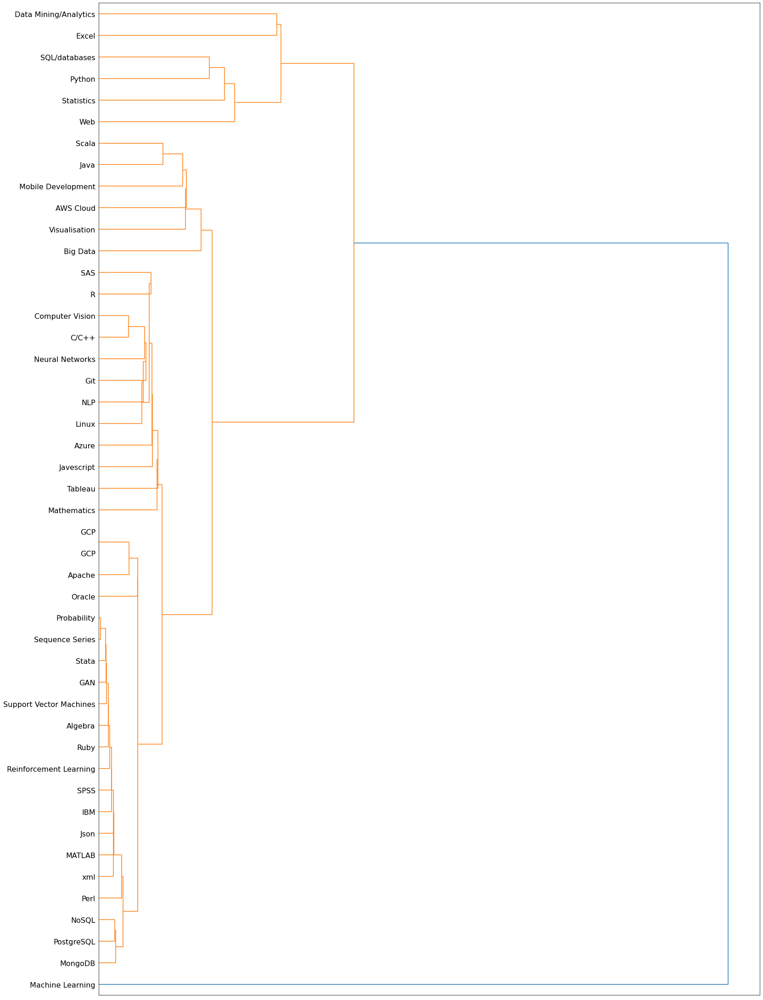

In [48]:
fig = plt.figure(figsize=(50,50))
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
skills_list5 = df_technical_skills.columns.values

Z1 = sch.dendrogram(Y5, orientation='right')
labels = skills_list5[Z1['leaves']]
                     
ax1.set_xticks([])
ax1.set_yticklabels(labels,fontsize=16)

plt.plot() # supress prints

# Kaggle Survey

In [49]:
df_Kaggle2018 = pd.read_csv('Kaggle2018.csv', index_col=None, header=0) 
df_Kaggle2019 = pd.read_csv('Kaggle2019.csv', index_col=None, header=0) 
KaggleQuestions = pd.read_csv('KaggleQuestions.csv', index_col=None, header=0)

In [50]:
df_Kaggle2018.head(1)

,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,Q7,Q7_OTHER_TEXT,Q8,Q9,Q10,Q11_Part_1,Q11_Part_2,Q11_Part_3,Q11_Part_4,Q11_Part_5,Q11_Part_6,Q11_Part_7,Q11_OTHER_TEXT,Q12_MULTIPLE_CHOICE,Q12_Part_1_TEXT,Q12_Part_2_TEXT,Q12_Part_3_TEXT,Q12_Part_4_TEXT,Q12_Part_5_TEXT,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15,Q13_OTHER_TEXT,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER_TEXT,Q15_Part_1,Q15_Part_2,Q15_Part_3,Q15_Part_4,Q15_Part_5,Q15_Part_6,Q15_Part_7,Q15_OTHER_TEXT,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_Part_16,Q16_Part_17,Q16_Part_18,Q16_OTHER_TEXT,Q17,Q17_OTHER_TEXT,Q18,Q18_OTHER_TEXT,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_Part_6,Q19_Part_7,Q19_Part_8,Q19_Part_9,Q19_Part_10,Q19_Part_11,Q19_Part_12,Q19_Part_13,Q19_Part_14,Q19_Part_15,Q19_Part_16,Q19_Part_17,Q19_Part_18,Q19_Part_19,Q19_OTHER_TEXT,Q20,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_Part_6,Q21_Part_7,Q21_Part_8,Q21_Part_9,Q21_Part_10,Q21_Part_11,Q21_Part_12,Q21_Part_13,Q21_OTHER_TEXT,Q22,Q22_OTHER_TEXT,Q23,Q24,Q25,Q26,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_Part_7,Q27_Part_8,Q27_Part_9,Q27_Part_10,Q27_Part_11,Q27_Part_12,Q27_Part_13,Q27_Part_14,Q27_Part_15,Q27_Part_16,Q27_Part_17,Q27_Part_18,Q27_Part_19,Q27_Part_20,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_Part_13,Q28_Part_14,Q28_Part_15,Q28_Part_16,Q28_Part_17,Q28_Part_18,Q28_Part_19,Q28_Part_20,Q28_Part_21,Q28_Part_22,Q28_Part_23,Q28_Part_24,Q28_Part_25,Q28_Part_26,Q28_Part_27,Q28_Part_28,Q28_Part_29,Q28_Part_30,Q28_Part_31,Q28_Part_32,Q28_Part_33,Q28_Part_34,Q28_Part_35,Q28_Part_36,Q28_Part_37,Q28_Part_38,Q28_Part_39,Q28_Part_40,Q28_Part_41,Q28_Part_42,Q28_Part_43,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_Part_13,Q29_Part_14,Q29_Part_15,Q29_Part_16,Q29_Part_17,Q29_Part_18,Q29_Part_19,Q29_Part_20,Q29_Part_21,Q29_Part_22,Q29_Part_23,Q29_Part_24,Q29_Part_25,Q29_Part_26,Q29_Part_27,Q29_Part_28,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_Part_13,Q30_Part_14,Q30_Part_15,Q30_Part_16,Q30_Part_17,Q30_Part_18,Q30_Part_19,Q30_Part_20,Q30_Part_21,Q30_Part_22,Q30_Part_23,Q30_Part_24,Q30_Part_25,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32,Q32_OTHER,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_OTHER_TEXT,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q35_OTHER_TEXT,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_Part_10,Q36_Part_11,Q36_Part_12,Q36_Part_13,Q36_OTHER_TEXT,Q37,Q37_OTHER_TEXT,Q38_Part_1,Q38_Part_2,Q38_Part_3,Q38_Part_4,Q38_Part_5,Q38_Part_6,Q38_Part_7,Q38_Part_8,Q38_Part_9,Q38_Part_10,Q38_Part_11,Q38_Part_12,Q38_Part_13,Q38_Part_14,Q38_Part_15,Q38_Part_16,Q38_Part_17,Q38_Part_18,Q38_Part_19,Q38_Part_20,Q38_Part_21,Q38_Part_22,Q38_OTHER_TEXT,Q39_Part_1,Q39_Part_2,Q40,Q41_Part_1,Q41_Part_2,Q41_Part_3,Q42_Part_1,Q42_Part_2,Q42_Part_3,Q42_Part_4,Q42_Part_5,Q42_OTHER_TEXT,Q43,Q44_Part_1,Q44_Part_2,Q44_Part_3,Q44_Part_4,Q44_Part_5,Q44_Part_6,Q45_Part_1,Q45_Part_2,Q45_P

In [51]:
df_Kaggle2019.head(1)

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_OTHER_TEXT,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q14_OTHER_TEXT,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_OTHER_TEXT,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q17_OTHER_TEXT,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q18_OTHER_TEXT,Q19,Q19_OTHER_TEXT,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_OTHER_TEXT,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q24_OTHER_TEXT,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q25_OTHER_TEXT,Q26_Part_1,Q26_Part_2,Q26_Part_3,Q26_Part_4,Q26_Part_5,Q26_Part_6,Q26_Part_7,Q26_OTHER_TEXT,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,What is your gender? - Prefer to self-describe - Text,In which country do you currently reside?,What is the highest level of formal education that you have attained or plan to attain within the next 2 years?,Select the title most similar to your current role (or most recent title if retired): - Selected Choice,Select the title most similar to your current role (or most recent title if retired): - Other - Text,What is the size of the company where you are employed?,Approximately how many individuals are responsible for data science workloads at your place of business?,Does your current employer incorporate machine learning methods into their business?,Select any activities that make up an important part of your role at work: (Select all that apply) - Selected Choice - Analyze and understand data to influence product or business decisions,"Select any activities that make up an important part of your role at work: (Select all that apply) - Selected Choice - Build and/or run the data infrastructure that my business uses for storing, analyzing, and operationalizing data",Select any activities that make up an important part of you

## Exploratory Data Analysis for Kaggle Data

In [52]:
# Q40 in 2018 asked the opinion on academic achievements vs independent projects
ds_project = df_Kaggle2018.iloc[1:,:].groupby('Q40')['Q40'].count()
project_dict = {}
# group people with similiar selection togrther
project_dict['Independent Projects'] = ds_project[ds_project.index.str.contains('more')].sum()/ ( df_Kaggle2018.shape[0]-1)
project_dict['Equal'] = ds_project[ds_project.index.str.contains('equal')].sum()/ ( df_Kaggle2018.shape[0]-1)
project_dict['Academic Achievements'] = ds_project[ds_project.index.str.contains('less')].sum()/ ( df_Kaggle2018.shape[0]-1)
project_dict['No Opinion'] = ds_project[ds_project.index.str.contains('No opinion')].sum()/ ( df_Kaggle2018.shape[0]-1)
df_project = pd.DataFrame(project_dict, index=[0])

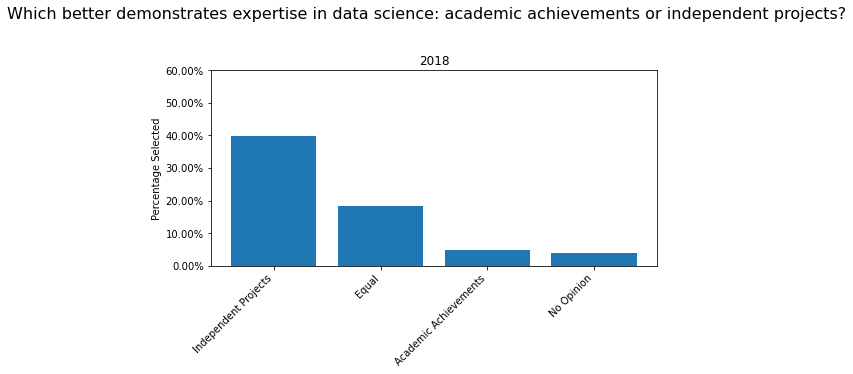

In [53]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which better demonstrates expertise in data science: academic achievements or independent projects?', fontsize=16, y = 1.1)
ax1.bar(df_project.columns, df_project.iloc[0].values)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

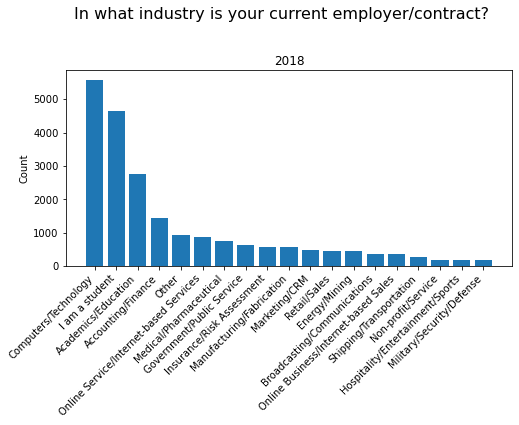

In [54]:
# Q7 in 2018 asked the industry peoplw work in
ds_industry = df_Kaggle2018.iloc[1:,:].groupby('Q7')['Q7'].count().sort_values( ascending=False)
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('In what industry is your current employer/contract?', fontsize=16, y = 1.1)
ax1.bar(ds_industry.index, ds_industry)
ax1.set_title('2018')
vals = ax1.get_yticks()
ax1.set_ylabel('Count')
fig.autofmt_xdate(rotation=45)

In [55]:
# format all multi-select question to a nested dictionay with queation names and the count of each select for 2018 Kaggel Survey
options_2018 = df_Kaggle2018.iloc[0, :][df_Kaggle2018.iloc[0, :].str.contains("Selected Choice -")].index
questions_2018 = df_Kaggle2018[options_2018].iloc[0, :].values
df_Kaggle2018 = df_Kaggle2018[options_2018].iloc[1:, :]

question_options_2018 = defaultdict(list)
for question in questions_2018:
    key = question.split(' (Select all that apply)')[0].strip()
    key = KaggleQuestions[KaggleQuestions['2018'] == key].Name.values
    if len(key) == 1:
        key = key[0]
        value = question.split(' - Selected Choice - ')[-1].strip()
        question_options_2018[key].append(value)
    else:
        print(question.split(' (Select all that apply)')[0].strip())

    
dict_Kaggle2018 = {}
start_col = 0
for question, options in question_options_2018.items():
    end_col = start_col + len(options)
    count = list(df_Kaggle2018.iloc[:, start_col:end_col].notna().sum())
    df = pd.DataFrame(count, index = options, columns =['Count']) 
    df['Percent'] = df.Count / df_Kaggle2018.shape[0]
    dict_Kaggle2018[question] = df
    start_col = end_col
    

In [56]:
# format all multi-select question to a nested dictionay with queation names and the count of each select for 2019 Kaggel Survey
options_2019 = df_Kaggle2019.iloc[0, :][df_Kaggle2019.iloc[0, :].str.contains("Selected Choice -")].index
questions_2019 = df_Kaggle2019[options_2019].iloc[0, :].values
df_Kaggle2019 = df_Kaggle2019[options_2019].iloc[1:, :]

question_options_2019 = defaultdict(list)
for question in questions_2019:
    key = question.split(' (Select all that apply)')[0].strip()
    key = KaggleQuestions[KaggleQuestions['2019'] == key].Name.values
    if len(key) == 1:
        key = key[0]
        value = question.split(' - Selected Choice - ')[-1].strip()
        question_options_2019[key].append(value)
    else:
        print(question.split(' (Select all that apply)')[0].strip())
    
dict_Kaggle2019 = {}
start_col = 0
for question, options in question_options_2019.items():
    end_col = start_col + len(options)
    count = list(df_Kaggle2019.iloc[:, start_col:end_col].notna().sum())
    df = pd.DataFrame(count, index = options, columns =['Count']) 
    df['Percent'] = df.Count / df_Kaggle2019.shape[0]
    dict_Kaggle2019[question] = df
    start_col = end_col

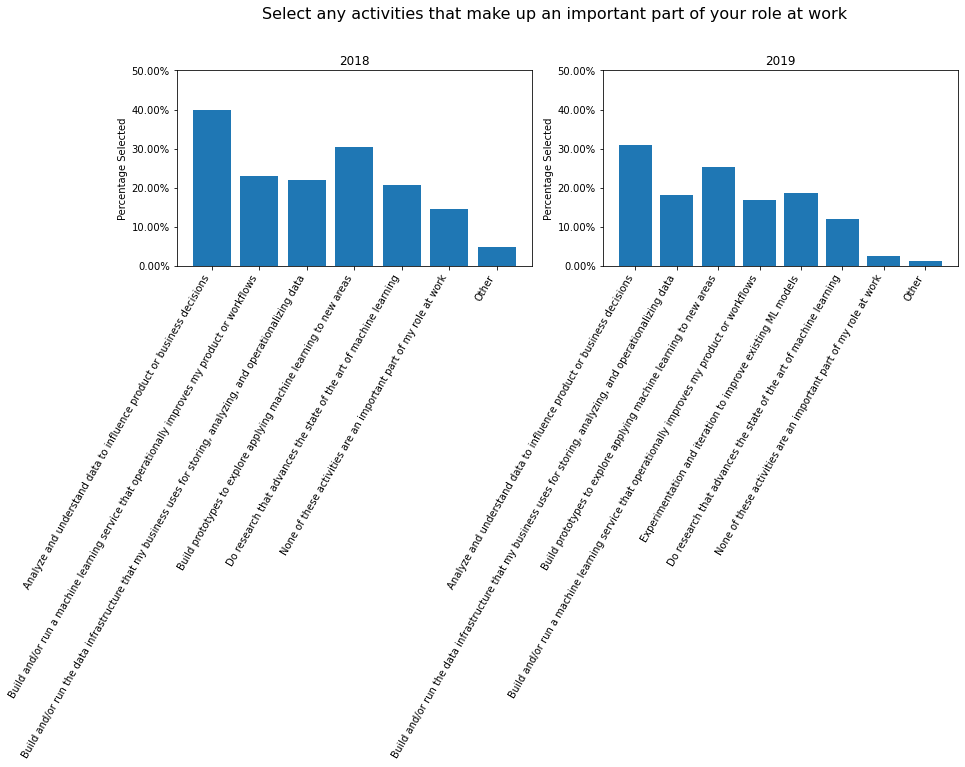

In [57]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Select any activities that make up an important part of your role at work\n', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Daily Activity'].index, dict_Kaggle2018['Daily Activity'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.5)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Daily Activity'].index, dict_Kaggle2019['Daily Activity'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.5)
fig.autofmt_xdate(rotation=60)
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
plt.show()

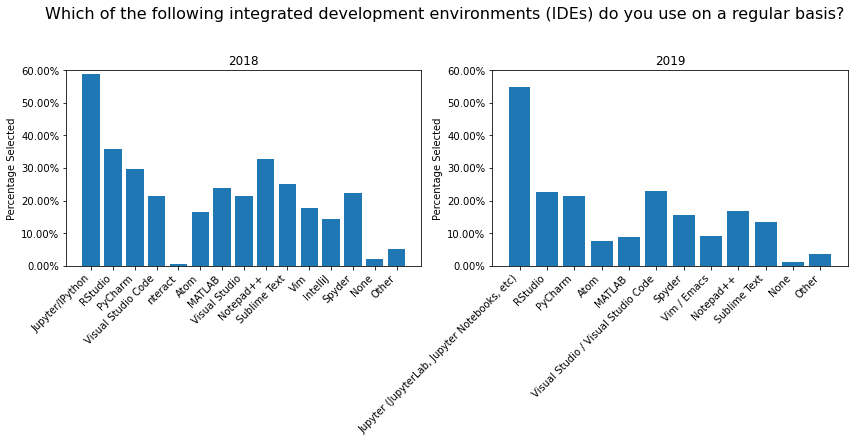

In [58]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following integrated development environments (IDE''s) do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['IDE'].index, dict_Kaggle2018['IDE'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['IDE'].index, dict_Kaggle2019['IDE'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

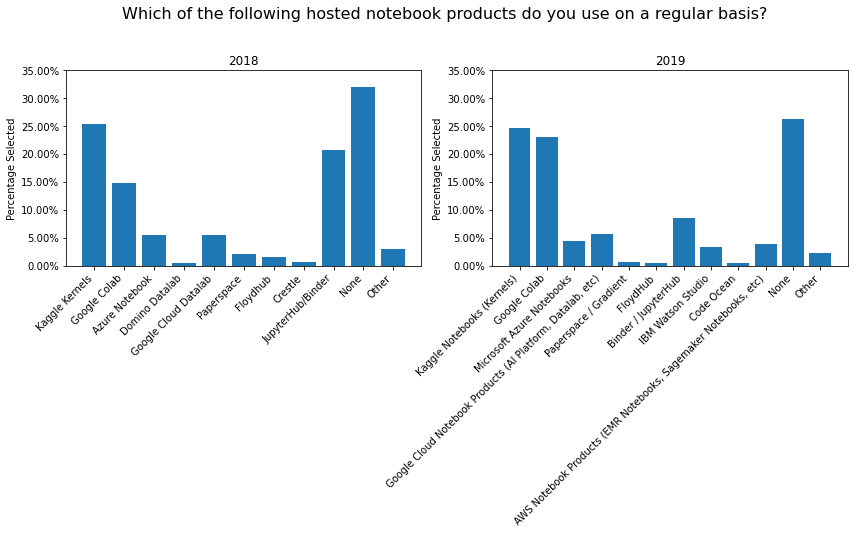

In [59]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following hosted notebook products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Notebook'].index, dict_Kaggle2018['Notebook'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.35)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Notebook'].index, dict_Kaggle2019['Notebook'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.35)
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

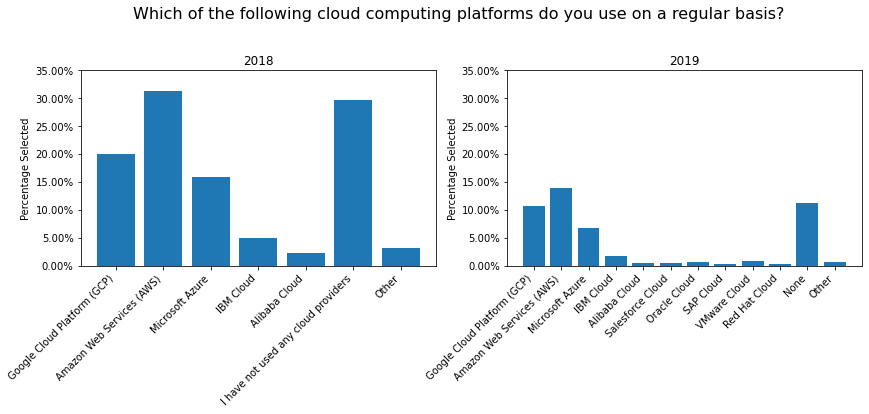

In [60]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following cloud computing platforms do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Cloud Service'].index, dict_Kaggle2018['Cloud Service'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.35)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Cloud Service'].index, dict_Kaggle2019['Cloud Service'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.35)
vals = ax1.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

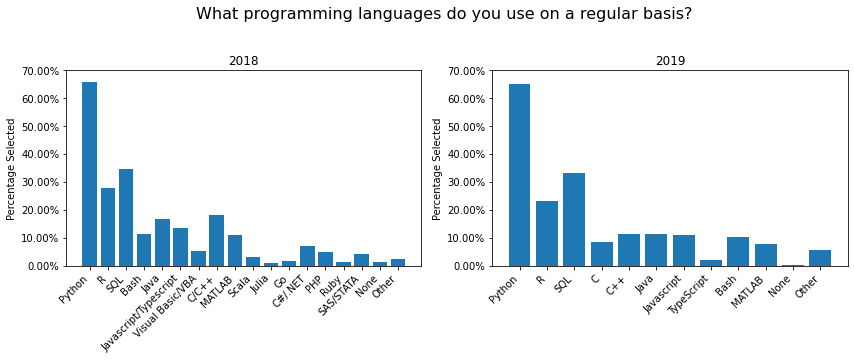

In [61]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('What programming languages do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Programming Language'].index, dict_Kaggle2018['Programming Language'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.7)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Programming Language'].index, dict_Kaggle2019['Programming Language'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.7)
vals = ax1.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

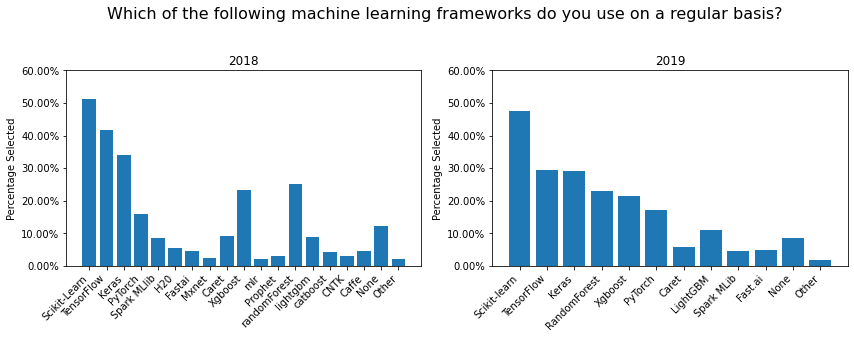

In [62]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following machine learning frameworks do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['ML Framework'].index, dict_Kaggle2018['ML Framework'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['ML Framework'].index, dict_Kaggle2019['ML Framework'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

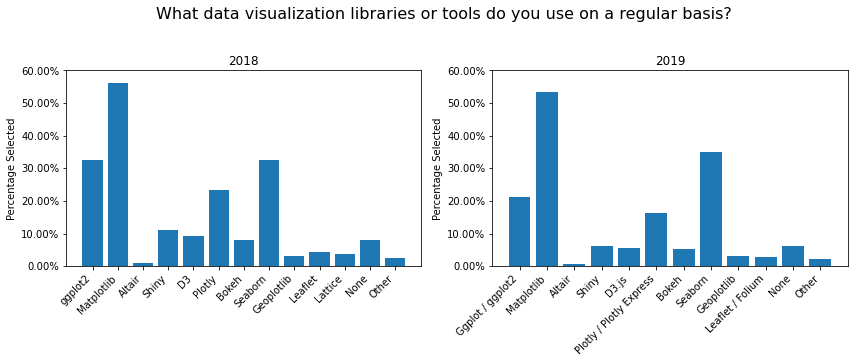

In [63]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('What data visualization libraries or tools do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Visualization Library'].index, dict_Kaggle2018['Visualization Library'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Visualization Library'].index, dict_Kaggle2019['Visualization Library'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

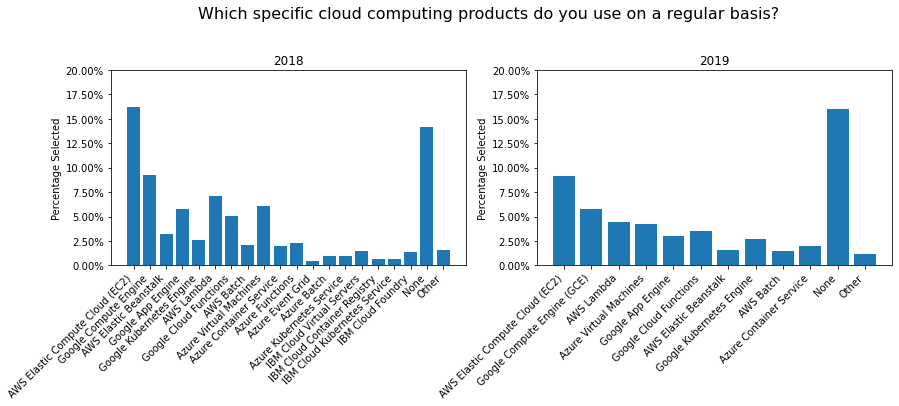

In [64]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which specific cloud computing products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Cloud Product'].index, dict_Kaggle2018['Cloud Product'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.2)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Cloud Product'].index, dict_Kaggle2019['Cloud Product'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.2)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

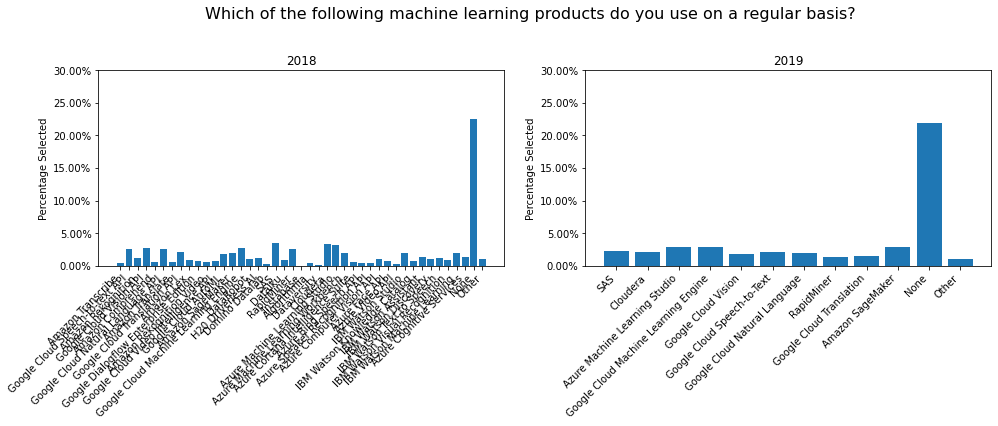

In [65]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(16)
fig.suptitle('Which of the following machine learning products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['ML Product'].index, dict_Kaggle2018['ML Product'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.3)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['ML Product'].index, dict_Kaggle2019['ML Product'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.3)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

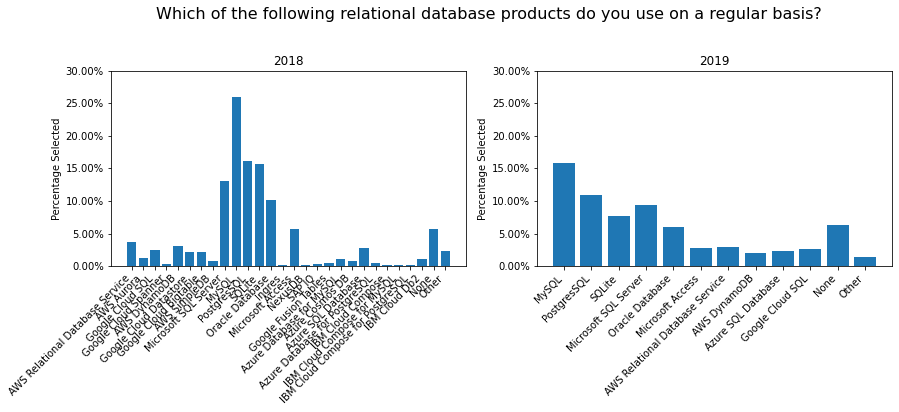

In [66]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following relational database products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Database Product'].index, dict_Kaggle2018['Database Product'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.3)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Database Product'].index, dict_Kaggle2019['Database Product'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.3)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

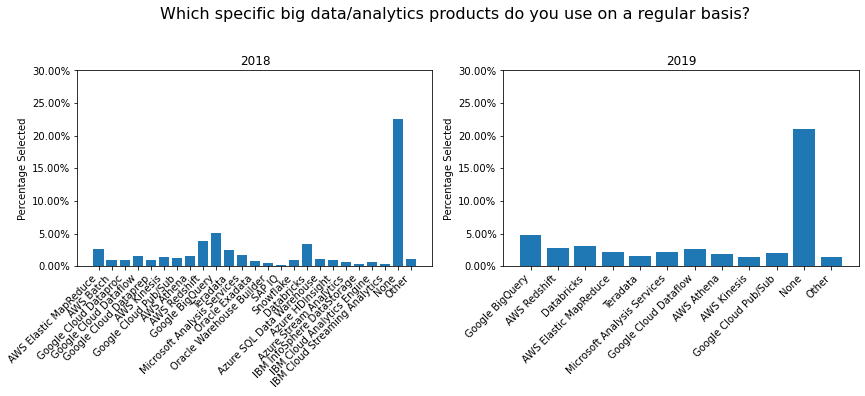

In [67]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which specific big data/analytics products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Big Data Product'].index, dict_Kaggle2018['Big Data Product'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.3)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Big Data Product'].index, dict_Kaggle2019['Big Data Product'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.3)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

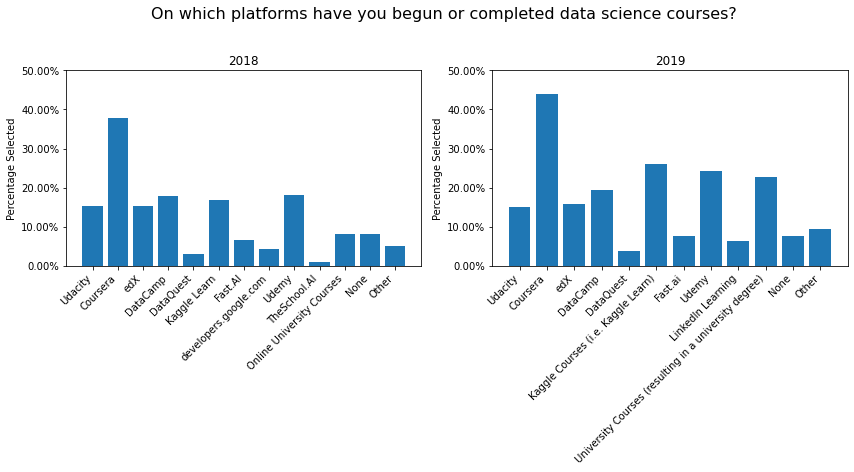

In [68]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('On which platforms have you begun or completed data science courses?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Course Platform'].index, dict_Kaggle2018['Course Platform'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.5)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Course Platform'].index, dict_Kaggle2019['Course Platform'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.5)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

Since Coursera has been a popular choice looking at the data it was selected as one of the websites to collect information of courses being taugh in the field of Data Science.

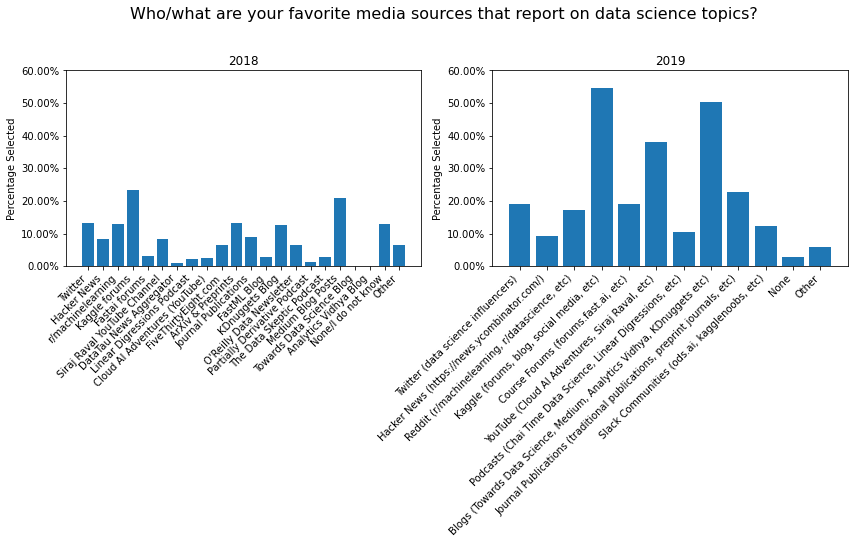

In [69]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Who/what are your favorite media sources that report on data science topics?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Media Source'].index, dict_Kaggle2018['Media Source'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Media Source'].index, dict_Kaggle2019['Media Source'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

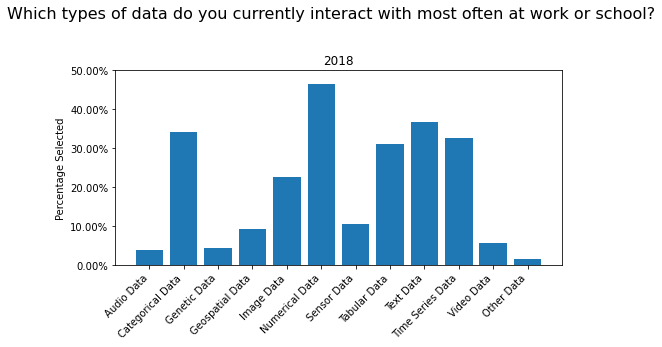

In [70]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which types of data do you currently interact with most often at work or school?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Data Type'].index, dict_Kaggle2018['Data Type'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.5)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

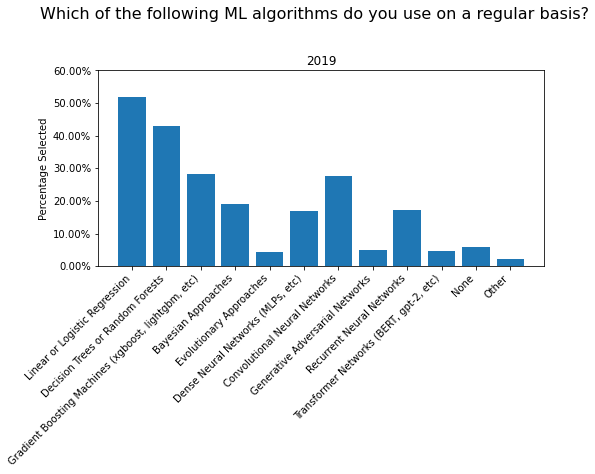

In [71]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which of the following ML algorithms do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2019['ML Algorithm'].index, dict_Kaggle2019['ML Algorithm'].Percent)
ax1.set_title('2019')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

# Looking at Coursera Data

In [72]:
df_coursera = pd.read_csv('UCoursera_Courses.csv')
df_coursera.head(2)

,Unnamed: 0,Course Title,Course Organization,Course Certificate_type,Course Rating,Course Difficulty,Course Intro,Course Skill
0,0,IBM Data Science,IBM,PROFESSIONAL CERTIFICATE,4.6,Beginner,Data ScienceStatistical AnalysisMachine LearningPython ProgrammingBusiness IntelligenceData AnalysisPandasNumpyCloud DatabasesIpythonRelational Database Management System (RDBMS)SQL,", Data Science, Statistical Analysis, Machine Learning, Python Programming, Business Intelligence, Data Analysis, Pandas, Numpy, Cloud Databases, Ipython, Relational Database Management System (RDBMS), SQL"
1,1,Data Science,Johns Hopkins University,SPECIALIZATION,4.5,Beginner,GithubMachine LearningR ProgrammingRegression AnalysisData ScienceRstudioData AnalysisDebuggingData ManipulationRegular Expression (REGEX)Data CleansingCluster Analysis,", Github, Machine Learning, R Programming, Regression Analysis, Data Science, Rstudio, Data Analysis, Debugging, Data Manipulation, Regular Expression (REGEX), Data Cleansing, Cluster Analysis"


In [73]:
df_coursera_scrapped = df_coursera[['Course Title', 'Course Skill']]
df_coursera_scrapped.head(2)

,Course Title,Course Skill
0,IBM Data Science,", Data Science, Statistical Analysis, Machine Learning, Python Programming, Business Intelligence, Data Analysis, Pandas, Numpy, Cloud Databases, Ipython, Relational Database Management System (RDBMS), SQL"
1,Data Science,", Github, Machine Learning, R Programming, Regression Analysis, Data Science, Rstudio, Data Analysis, Debugging, Data Manipulation, Regular Expression (REGEX), Data Cleansing, Cluster Analysis"


In [74]:
res = pd.DataFrame(df_coursera_scrapped['Course Skill'].str.split(',').tolist())
final = pd.concat([df_coursera_scrapped, res],axis=1)
final = final.drop(final.columns[2], axis=1)
final.head(1)

,Course Title,Course Skill,1,2,3,4,5,6,7,8,9,10,11,12,13
0,IBM Data Science,", Data Science, Statistical Analysis, Machine Learning, Python Programming, Business Intelligence, Data Analysis, Pandas, Numpy, Cloud Databases, Ipython, Relational Database Management System (RDBMS), SQL",Data Science,Statistical Analysis,Machine Learning,Python Programming,Business Intelligence,Data Analysis,Pandas,Numpy,Cloud Databases,Ipython,Relational Database Management System (RDBMS),SQL,None


In [75]:
# return list from series of comma-separated strings
def chainer(s):
    return list(chain.from_iterable(s.str.split(',')))

# calculate lengths of splits
lens = df_coursera_scrapped['Course Skill'].str.split(',').map(len)

# create new dataframe, repeating or chaining as appropriate
res_2 = pd.DataFrame({'Course Title': np.repeat(df_coursera_scrapped['Course Title'], lens),
                      'Course Skill': chainer(df_coursera_scrapped['Course Skill'])})
res_2 = res_2.sort_values('Course Title')
res_2.head()

,Course Title,Course Skill
535,3D Data Visualization for Science Communication,Ipython
535,3D Data Visualization for Science Communication,SQL
535,3D Data Visualization for Science Communication,Data Science
535,3D Data Visualization for Science Communication,Relational Database Management System (RDBMS)
535,3D Data Visualization for Science Communication,Cloud Databases


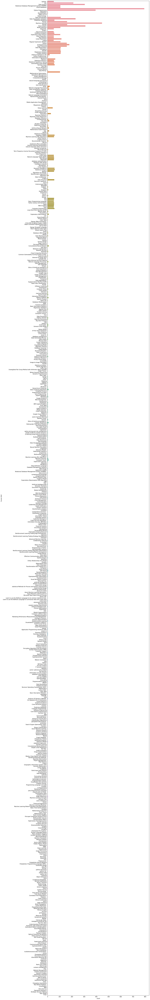

In [76]:
fig, ax = plt.subplots(figsize=(15,150))
ax = sns.countplot(ax = ax, y='Course Skill',data=res_2)


In [77]:
res_2['Course Skill'].value_counts()

                        793
 Machine Learning       447
                       ... 
 Market Segmentation    1  
 Azure AI models        1  
Name: Course Skill, Length: 692, dtype: int64

In [78]:
encoded = pd.get_dummies(data=res_2, columns=['Course Skill'])
encoded = encoded.drop(encoded.columns[1:4], axis=1)
group = encoded.groupby(by="Course Title",axis=0).sum()
group.head()

,Course Skill_ A Priori And A Posteriori,Course Skill_ A/B Testing,Course Skill_ Active Listening,Course Skill_ Advanced Machine Learning,Course Skill_ Algorithm Training,Course Skill_ Algorithms,Course Skill_ Algorithms On Strings,Course Skill_ Analyse de donnees,Course Skill_ Analysis Of Variance (ANOVA),Course Skill_ Analytics,Course Skill_ Android,Course Skill_ Android Studio,Course Skill_ Apache Hadoop,Course Skill_ Apache Hive,Course Skill_ Apache Impala,Course Skill_ Apache Parquet,Course Skill_ Apache Spark,Course Skill_ Apache Spark,Course Skill_ Application Programming Interfaces (API),Course Skill_ Artificial Intelligence (AI),Course Skill_ Artificial Intelligence(AI),Course Skill_ Artificial Intelligence(AI),Course Skill_ Artificial Neural Network,Course Skill_ Attention Models,Course Skill_ Attention Models,Course Skill_ Auto ML,Course Skill_ Azure,Course Skill_ Azure AI models,Course Skill_ Azure LUIS,Course Skill_ Azure Machine Learning,Course Skill_ Azure Machine Learning Service,Course Skill_ Azure Machine Learning Workspace,Course Skill_ BERT,Course Skill_ Backpropagation,Course Skill_ Backtesting,Course Skill_ Banking,Course Skill_ Bash (Unix Shell),Course Skill_ Basic Descriptive Statistics,Course Skill_ Basic Descriptive Statistics,Course Skill_ Basic Programming Language,Course Skill_ Basic Time Series Analysis,Course Skill_ Basis (Linear Algebra),Course Skill_ Bayes' Theorem,Course Skill_ Bayesian Inference,Course Skill_ Bayesian Linear Regression,Course Skill_ Bayesian Optimization,Course Skill_ Bayesian Statistics,Course Skill_ Belief Propagation,Course Skill_ Big Data,Course Skill_ Big Data Products,Course Skill_ Bigquery,Course Skill_ Binary Classification,Course Skill_ Binary Code,Course Skill_ Binary Search Tree,Course Skill_ Bioinformatics,Course Skill_ Bioinformatics Algorithms,Course Skill_ Bioinformatics Analysis,Course Skill_ Biology,Course Skill_ Biopython,Course Skill_ Biostatistics,Course Skill_ Biotechnology,Course Skill_ Bitcoin,Course Skill_ Brain,Course Skill_ Build Input Data Pipeline,Course Skill_ Business Analytics,Course Skill_ Business Analytics,Course Skill_ Business Intelligence,Course Skill_ Business Intelligence,Course Skill_ Business Strategy,Course Skill_ C Programming,Course Skill_ CNN,Course Skill_ Calculus,Course Skill_ Causal Inference,Course Skill_ Chatterbot,Course Skill_ Chi-Squared (Chi-2) Distribution,Course Skill_ Ciencia de Datos,Course Skill_ Classification Algorithms,Course Skill_ Classification de Texte,Course Skill_ Cleaning,Course Skill_ Cloud Computing,Course Skill_ Cloud Computing,Course Skill_ Cloud Computing Security,Course Skill_ Cloud Databases,Course Skill_ Cloud Storage,Course Skill_ Cloudera,Course Skill_ Cloudera,Course Skill_ Cluster Analysis,Course Skill_ Cluster Sampling,Course Skill_ Code of Ethics,Course Skill_ Collaborative Filtering,Course Skill_ Collective Intelligence,Course Skill_ Common Vulnerability Scoring System (CVSS),Course Skill_ Communicating about Data,Course Skill_ Communication,Course Skill_ Comparative Genomics,Course Skill_ Compiler,Course Skill_ Computational Biology,Course Skill_ Computer Programming,Course Skill_ Computer Programming,Course Skill_ Computer Science,Course Skill_ Computer Science,Course Skill_ Computer Vision,Course Skill_ Computer Vision,Course Skill_ Conditional Probability,Course Skill_ Confidence Interval,Course Skill_ Contact Tracing,Course Skill_ Convolutional Neural Network,Course Skill_ Convolutional Neural Networks,Course Skill_ Core Python Programming,Course Skill_ Correlation And Dependence,Course Skill_ Crisis Management,Course Skill_ Critical Value,Course Skill_ Cross-Sectional Analysis,Course Skill_ Cross-Site Scripting Forgery (CSRF),Course Skill_ Cryptocurrency,Course Skill_ Cryptography,Course Skill_ Customer Lifetime Value,Course Skill_ Customer Service,Course Skill_ Customer Support,Course Skill_ Cyber Attacks,Course Skill_ Cyber-Security Regulation,Course Skill_ Cybersecurity,Course Skill_ 

In [79]:
df_group_t = group.transpose()
df_group_t.head()

Course Title,3D Data Visualization for Science Communication,3D SARS-CoV-19 Protein Visualization With Biopython,A Complete Reinforcement Learning System (Capstone),A Crash Course in Data Science,A Geometrical Approach to Genome Analysis: Skew & Z-Curve,AI Foundations for Everyone,AI Workflow: AI in Production,AI Workflow: Enterprise Model Deployment,AI Workflow: Feature Engineering and Bias Detection,"AI Workflow: Machine Learning, Visual Recognition and NLP",AI for Medicine,AI in Healthcare,Accounting Data Analytics,Accounting Data Analytics with Python,Advanced Linear Models for Data Science 1: Least Squares,Advanced Linear Models for Data Science 2: Statistical Linear Models,Advanced Machine Learning,Advanced Machine Learning and Signal Processing,Advanced Relational Database and SQL,Advanced SAS Programming Techniques,Advanced Statistics for Data Science,Algorithms,Algorithms for DNA Sequencing,"Algorithms, Part II",Analizando sentimientos y entidades en textos con Azure,Analysing Unstructured Data using MongoDB and PySpark,Analyze Box Office Data with Plotly and Python,Analyze Stock Data using R and Quantmod Package,Analyzing Video with OpenCV and NumPy,Anomaly Detection in Time Series Data with Keras,Análisis de datos con Python,Applied AI with DeepLearning,Applied Data Science,Applied Data Science with Python,"Applied Plotting, Charting & Data Representation in Python",Apply Generative Adversarial Networks (GANs),Applying Data Analytics in Marketing,Apprendre à une IA des jeux de stratégie avec easyAI,Aprendizaje Automático con Python,Art and Science of Machine Learning em Português Brasileiro,AstroTech: The Science and Technology behind Astronomical Discovery,AutoML avec AutoKeras - Classification d'images,AutoML con Pycaret y TPOT,AutoML for Computer Vision with Microsoft Custom Vision,Automatic Machine Learning with H2O AutoML and Python,Avoid Overfitting Using Regularization in TensorFlow,Bases de datos y SQL para ciencia de datos,"Basic Data Descriptors, Statistical Distributions, and Application to Business Decisions",Basic Image Classification with TensorFlow,Basic Recommender Systems,Basic Statistics,Bayesian Statistics: From Concept to Data Analysis,Big Data,Big Data - Capstone Project,Big Data Analysis with Scala and Spark,Big Data Applications: Machine Learning at Scale,Big Data Science with the BD2K-LINCS Data Coordination and Integration Center,Big Data: adquisición y almacenamiento de datos,Big Data: procesamiento y análisis,Bioinformatics,"Biological Diversity (Theories, Measures and Data sampling techniques)",Biostatistics in Public Health,Build Basic Generative Adversarial Networks (GANs),Build Better Generative Adversarial Networks (GANs),Build a Deep Learning Based Image Classifier with R,Build a Google Firebase Web Application,Build a Python GUI with Tkinter,Build an E-commerce Dashboard with Figma,Building AI Applications with Watson APIs,Building Data Visualization Tools,Building R Packages,Building Recommendation System Using MXNET on AWS Sagemaker,Building a Data Science Team,Business Analytics,Business Applications of Hypothesis Testing and Confidence Interval Estimation,Business Statistics and Analysis,Business Statistics and Analysis Capstone,Business Transformation with Google Cloud,Business Transformation with Google Cloud auf Deutsch,COVID19 Data Analysis Using Python,COVID19 Data Visualization Using Python,Calculus and Optimization for Machine Learning,Capstone: Analyzing (Social) Network Data,"Capstone: Retrieving, Processing, and Visualizing Data with Python",Causal Inference,Classification with Transfer Learning in Keras,Climate Geospatial Analysis on Python with Xarray,Cluster Analysis in Data Mining,Combining and Analyzing Complex Data,Communicating Business Analytics Results,Communicating Data Science Results,Computational Neuroscience,Computational Social Science,Computational Social Science Methods,Computational Thinking for Problem Solving,Computer Architecture,Computer Science: 

[]

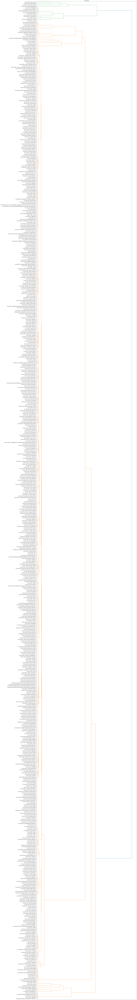

In [80]:

fig = plt.figure(figsize=(60, 400))  
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
plt.title("Dendrograms")  

dend = sch.dendrogram(sch.linkage(df_group_t, method='ward'),orientation='right')
labels = zip(group.columns[dend['leaves']])
ax1.set_xticks([])
ax1.set_yticklabels(labels,{'fontsize': 14})

plt.plot() # supress prints

In [81]:
#group.to_csv("Skill_Title.csv", index=False)

Remove courses with low rating

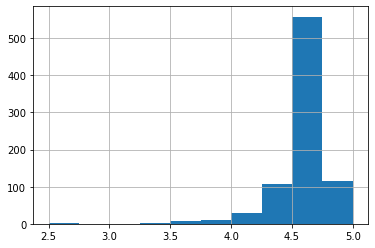

In [82]:
df_coursera = df_coursera[(df_coursera['Course Rating'] != ' ')]
df_coursera["Course Rating"] = pd.to_numeric(df_coursera["Course Rating"], downcast="float")
plot = df_coursera['Course Rating'].hist()

In [83]:
df_coursera = df_coursera[(df_coursera['Course Rating'] >=  4.5)]

Get Skills From the Courses

In [84]:
skill_counter = Counter()
skill_list = []
for i in range(len(df_coursera)):
    # the first item would always be an empty string, so we remove them
    skills = df_coursera.iloc[i, -1].split(', ')[1:]
    skill_counter.update(skills)
    # The list is used to make word cloud later, so we remove the spaces
    skills = [skill.replace(' ', '') for skill in skills]
    skill_list = skill_list + skills

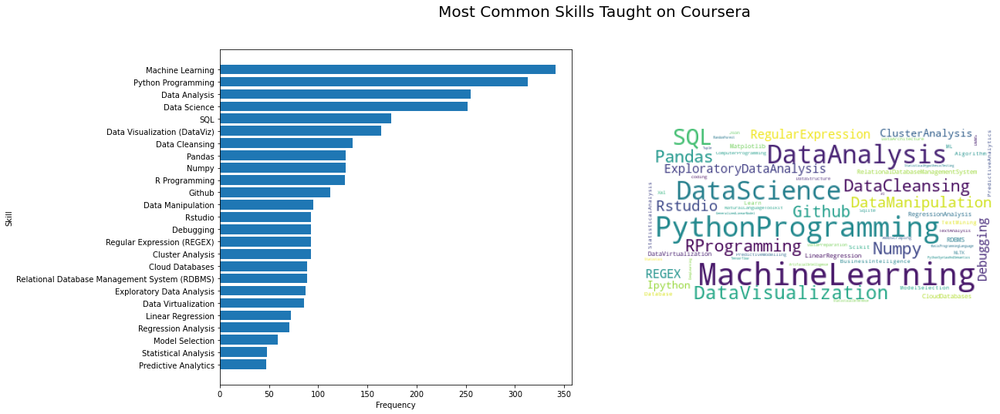

In [85]:
fig, axes = plt.subplots(1,2,figsize=(18,8))
# bar plot of top mentioned hashtags
top = 25
skills_sorted = sorted(skill_counter.keys(), key=lambda x:skill_counter[x], reverse=True)[:top][::-1]
axes[0].barh(skills_sorted, [skill_counter[x] for x in skills_sorted])
axes[0].set_xlabel('Frequency')
axes[0].set_ylabel('Skill')

# word cloud
wcloud = WordCloud(background_color='white',
                   stopwords=['DataViz'],
                   max_words=150,
                   max_font_size=35,
                   random_state=1,
                   collocations=False,
                  ).generate(' '.join(skill_list))
axes[1].imshow(wcloud)
axes[1].axis('off')
plt.suptitle('Most Common Skills Taught on Coursera', fontsize=20)
plt.show()

From the list above, we think that Machine Learning, Data Analysis, Data Science, Data Visualization, Data Virtualization would be the broader topics that can be used as the high level topics for the courses. Besides, based on exprience, we believe that Big Data should also be a course by itself. So we would use these as the key skills and to find other skills that taught togehter with there key skills.

In [86]:
key_skills = ['Machine Learning', 'Data Analysis', 'Data Science', 'Data Visualization (DataViz)', 'Data Virtualization', 'Big Data']

In [87]:
def countSkills(df, key_skills):
    skill_dict = {}

    for keySkill in key_skills:
        skill_counter = Counter()
        skill_list = []
        
        for i in range(len(df)):
            skills = df.iloc[i, -1].split(', ')[1:]
            if keySkill in skills:
                # the first item would always be an empty string, so we remove them
                skills.remove(keySkill)
                skill_counter.update(skills)
                skills = [skill.replace(' ', '') for skill in skills]
                skill_list = skill_list + skills
                
        for skill in list(skill_counter):
            if skill in key_skills:
                del skill_counter[skill]
        
        if(len(skill_counter.keys()) != 0):
            skill_dict[keySkill] = (skill_counter, skill_list)
        
    return skill_dict

In [88]:
skill_dict = countSkills(df_coursera, key_skills)

In [89]:
def plotSkills(skill_dict):
    fig, axes = plt.subplots(len(skill_dict.keys()),2,figsize=(18,len(skill_dict.keys())*8))
    
    
    for i in range(len(skill_dict.keys())):
        key_skill = list(skill_dict.keys())[i]
        skill_counter = skill_dict[key_skill][0]
        skill_list = skill_dict[key_skill][1]
        ignore = [skill.replace(' ', '') for skill in skills]
        # bar plot of top mentioned hashtags
        top = 20
        skills_sorted = sorted(skill_counter.keys(), key=lambda x:skill_counter[x], reverse=True)[:top][::-1]
        axes[i][0].barh(skills_sorted, [skill_counter[x] for x in skills_sorted])
        axes[i][0].set_xlabel('Frequency')
        axes[i][0].set_ylabel('Skill')
        axes[i][0].set_title('Top 20 Skills Taught in %s'%key_skills[i])

        # word cloud
        wcloud = WordCloud(background_color='white',
                           stopwords=['MachineLearning', 'DataAnalysis', 'DataScience', 'DataVisualization', 'DataViz', 'DataVirtualization', 'BigData'],
                           max_words=150,
                           max_font_size=35,
                           collocations=False,
                          ).generate(' '.join(skill_list))
        axes[i][1].imshow(wcloud)
        axes[i][1].axis('off')
        axes[i][1].set_title('Skills Taught in %s'%key_skill)
    plt.suptitle('Most Common skills Taught with Each Topic', fontsize=20)
    plt.show()

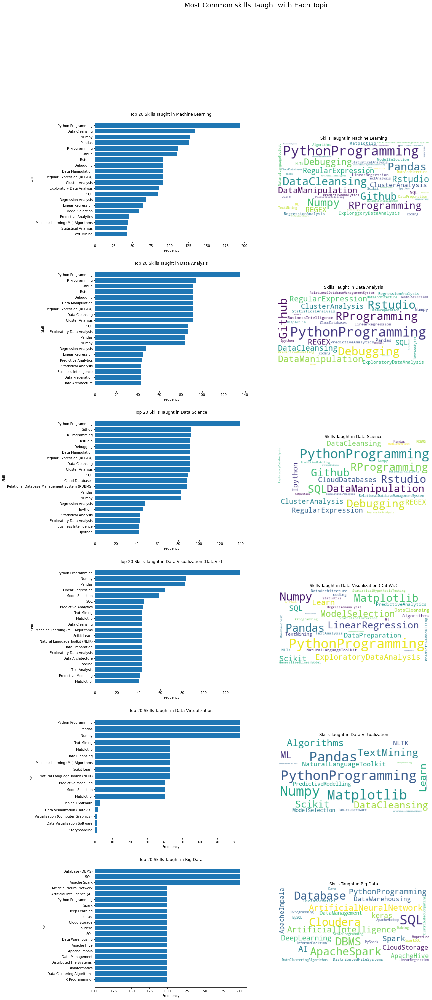

In [90]:
plotSkills(skill_dict)

# University Data Exploratory Data Analysis and Visualization

In [91]:
df_university = pd.read_csv('Uni_Courses.csv')
df_university.head()

,University Name,Course #,Course Name,Description,Course Type
0,UBC- Vancouver,DSCI 511,Programming for Data Science,"Program design and data manipulation with Python. Overview of data structures, iteration, flow control, and program design relevant to data exploration and analysis. When and how to exploit pre-existing libraries.",Core
1,UBC- Vancouver,DSCI 521,Computing Platforms for Data Science,"How to install, maintain, and use the data scientific software “stack”. The Unix shell, version control, and problem solving strategies. Literate programming documents.",Core
2,UBC- Vancouver,DSCI 523,Programming for Data Manipulation,"Program design and data manipulation with R. Organizing, filtering, sorting, grouping, reformatting, converting, and cleaning data to prepare it for further analysis.",Core
3,UBC- Vancouver,DSCI 551,Descriptive Statistics and Probability for Data Science,"Fundamental concepts in probability including conditional, joint, and marginal distributions. Statistical view of data coming from a probability distribution.",Core
4,UBC- Vancouver,DSCI 531,Data Visualization I,Exploratory data analysis. Design of effective static visualizations. Plotting tools in R and Python.,Core


In [92]:
df_university.describe()

,University Name,Course #,Course Name,Description,Course Type
count,155,138,154,134,155
unique,8,129,146,129,8
top,Waterloo,STAT 844,Introduction to Machine Learning,"This is a second course on databases that focuses on DBMS internals. It is a project-oriented course that will provide the students, upon successful completion, with an appreciation of the intricacies and complexities of a DBMS and enable them to be able to design and implement the major components of it. The course objective will be achieved by focusing on three fundamental sub-objectives: 1. To understand the fundamentals of storage systems and disk-based data structures;",Core
freq,42,2,2,2,100


In [93]:
df_university = df_university[['Course Name', 'Course Type']]
df_university.head()

,Course Name,Course Type
0,Programming for Data Science,Core
1,Computing Platforms for Data Science,Core
2,Programming for Data Manipulation,Core
3,Descriptive Statistics and Probability for Data Science,Core
4,Data Visualization I,Core


In [94]:
res_university = pd.DataFrame(df_university['Course Type'].str.split(',').tolist())
final = pd.concat([df_university, res_university],axis=1)
final = final.drop(final.columns[2], axis=1)
final.head()

,Course Name,Course Type
0,Programming for Data Science,Core
1,Computing Platforms for Data Science,Core
2,Programming for Data Manipulation,Core
3,Descriptive Statistics and Probability for Data Science,Core
4,Data Visualization I,Core


In [95]:
# return list from series of comma-separated strings
def chainer(s):
    return list(chain.from_iterable(s.str.split(',')))

# calculate lengths of splits
lens = df_university['Course Type'].str.split(',').map(len)

# create new dataframe, repeating or chaining as appropriate
res_university = pd.DataFrame({'Course Name': np.repeat(df_university['Course Name'], lens),
                      'Course Type': chainer(df_university['Course Type'])})
res_university = res_university.sort_values('Course Type')
res_university.head()

,Course Name,Course Type
154,Data Science Project (one and two),Capstone
39,AI Capstone,Capstone
24,Capstone Project,Capstone
110,Master’s Project - System & Functional Analysis,Capstone
111,Master’s Project - Implementation and Analysis of Results,Capstone


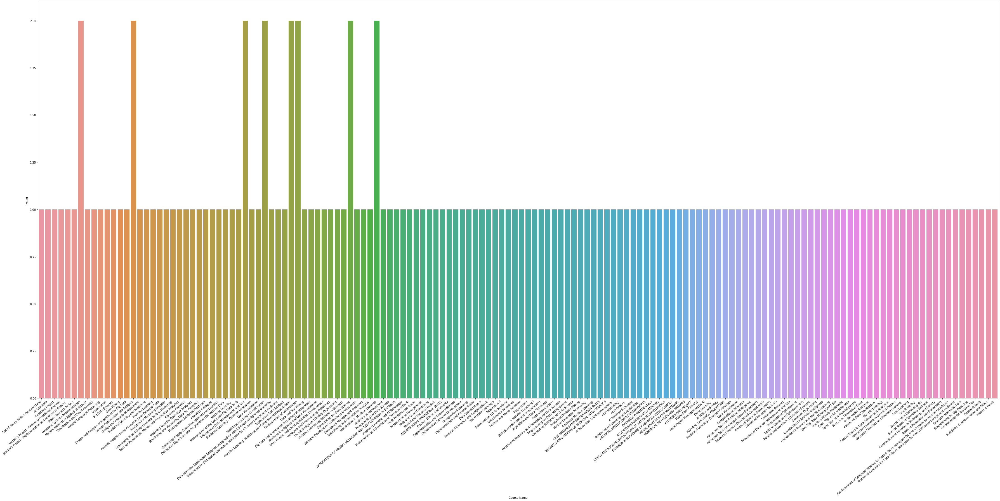

In [96]:
plt.figure(figsize=(50,25))
ax = sns.countplot(x="Course Name", data=res_university)

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

In [97]:
res_university['Course Type'].value_counts()

Core          100
Elective      41 
              .. 
Thesis        1  
Internship    1  
Name: Course Type, Length: 8, dtype: int64

In [98]:
res_university['Course Name'].value_counts()

Database Systems Implementation                   2
Optimization for Data Science                     2
                                                 ..
Advanced Topics in Artificial Intelligence        1
Design and Analysis of Algorithms for Big Data    1
Name: Course Name, Length: 146, dtype: int64

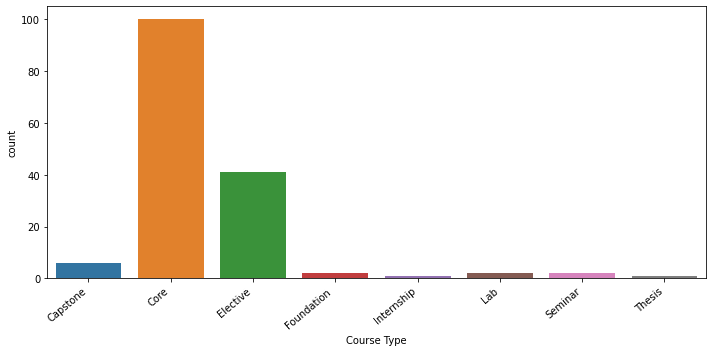

In [99]:
plt.figure(figsize=(10,5))
ax = sns.countplot(x="Course Type", data=res_university)

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

In [100]:
df_university_encoded = pd.get_dummies(data=res_university, columns=['Course Name'])
df_university_encoded.head(2)

,Course Type,Course Name_ Data Visualization,Course Name_ Database Engineering,Course Name_ Introduction to Artificial Intelligence,Course Name_ Statistical Learning - Function Estimation,Course Name_AI CONSULTING PROJECT,Course Name_AI Capstone,Course Name_AI Ethics and Policy,Course Name_AI Innovation & Enterpreneurship,Course Name_AI Strategy & Change,Course Name_AI in Finance,Course Name_AI in Marketing,Course Name_ALGORITHMS FOR BUSINESS ANALYSIS,Course Name_APPLICATIONS OF NEURAL NETWORKS AND DEEP LEARNING IN BUSINESS,Course Name_ARTIFICIAL INTELLIGENCE FUNDAMENTALS,Course Name_Advanced Data Visualization,Course Name_Advanced Machine Learning,Course Name_Advanced Research Topics(*),Course Name_Advanced Topics in Artificial Intelligence,Course Name_Advanced Topics in Computational Statistics(*),Course Name_Advanced Topics in Databases(*),Course Name_Advanced Topics in Distributed Computing(*),Course Name_Agile Project Management for AI,Course Name_Algorithms and Data Structures,Course Name_Analytic Insights using Accounting and Financial Data,Course Name_Analytical Decision Making,Course Name_Analytics Colloquia,Course Name_Analytics for Marketing Strategy,Course Name_Analytics in Management,Course Name_BUSINESS APPLICATIONS OF ARTIFICIAL INTELLIGENCE I,Course Name_BUSINESS APPLICATIONS OF ARTIFICIAL INTELLIGENCE II,Course Name_Bayesian Statistics and Machine Learning,Course Name_Big Data Analytics,Course Name_Big Data Systems,Course Name_Big Data and Information Technology Management,Course Name_Business intelligence and Data Visualization,Course Name_CASE ANALYSIS AND PRESENTATION SKILLS,Course Name_Capstone Project,Course Name_Collaborative Software Development,Course Name_Combinatorial Optimization,Course Name_Communication Theories in Technology and Society,Course Name_Communication and Argumentation,Course Name_Computational Inference,Course Name_Computing Platforms for Data Science,Course Name_Convex Optimization and Analysis,Course Name_DATABASE FUNDAMENTALS,Course Name_Data Mining,Course Name_Data Mining and Prescriptive Analysis,Course Name_Data Science Project (one and two),Course Name_Data Science Workflows,Course Name_Data Visualization,Course Name_Data Visualization I,Course Name_Data Visualization II,Course Name_Data and Text Mining,Course Name_Data-Based Management Decisions,Course Name_Data-Intensive Distributed Analytics (designed for non-CS major background students),Course Name_Data-Intensive Distributed Computing (designed for CS major background students),Course Name_Database Systems Implementation,Course Name_Databases and Data Retrieval,Course Name_Deep Learning,Course Name_Deep Learning,Course Name_Descriptive Statistics and Probability for Data Science,Course Name_Design and Analysis of Algorithms,Course Name_Design and Analysis of Algorithms for Big Data,Course Name_Designs of Algorithms and Programming for Massive Data,Course Name_Distributed Systems,Course Name_ETHICS AND SOCIETAL IMPLICATIONS OF ARTIFICIAL INTELLIGENCE,Course Name_Experimentation and Causal Inference,Course Name_Exploratory Data Analysis,Course Name_Feature and Model Selection,Course Name_Fundamentals of Computer Science for Data Science (designed for non-CS major background students),Course Name_Fundamentals of Optimization,Course Name_Graduate Internship I & II,Course Name_Graph Mining,Course Name_Graphics-HCI-Vis-Multimedia,Course Name_High Performance Teams,Course Name_Interactive Learning in Decision Process,Course Name_Introduction to Machine Learning,Course Name_Introduction to Management,Course Name_Leveraging AI and Deep Learning Tools in Marketing,Course Name_MANAGING CHANGE,Course Name_Machine Learning,Course Name_Machine Learning,Course Name_Machine Learning and AI Technology,Course Name_Machine Learning: Statistical and Computational Foundations,Course Name_Major Research Project,Course Name_Management Analytics Practicum,Course Name_Management of Big Data and Big Data Tools,Course Name_Managing and Programming D

In [101]:
df_university_encoded = df_university_encoded.drop(df_university_encoded.columns[1:4], axis=1)
df_university_group = df_university_encoded.groupby(by="Course Type",axis=0).sum()
df_university_group.head()

,Course Name_ Statistical Learning - Function Estimation,Course Name_AI CONSULTING PROJECT,Course Name_AI Capstone,Course Name_AI Ethics and Policy,Course Name_AI Innovation & Enterpreneurship,Course Name_AI Strategy & Change,Course Name_AI in Finance,Course Name_AI in Marketing,Course Name_ALGORITHMS FOR BUSINESS ANALYSIS,Course Name_APPLICATIONS OF NEURAL NETWORKS AND DEEP LEARNING IN BUSINESS,Course Name_ARTIFICIAL INTELLIGENCE FUNDAMENTALS,Course Name_Advanced Data Visualization,Course Name_Advanced Machine Learning,Course Name_Advanced Research Topics(*),Course Name_Advanced Topics in Artificial Intelligence,Course Name_Advanced Topics in Computational Statistics(*),Course Name_Advanced Topics in Databases(*),Course Name_Advanced Topics in Distributed Computing(*),Course Name_Agile Project Management for AI,Course Name_Algorithms and Data Structures,Course Name_Analytic Insights using Accounting and Financial Data,Course Name_Analytical Decision Making,Course Name_Analytics Colloquia,Course Name_Analytics for Marketing Strategy,Course Name_Analytics in Management,Course Name_BUSINESS APPLICATIONS OF ARTIFICIAL INTELLIGENCE I,Course Name_BUSINESS APPLICATIONS OF ARTIFICIAL INTELLIGENCE II,Course Name_Bayesian Statistics and Machine Learning,Course Name_Big Data Analytics,Course Name_Big Data Systems,Course Name_Big Data and Information Technology Management,Course Name_Business intelligence and Data Visualization,Course Name_CASE ANALYSIS AND PRESENTATION SKILLS,Course Name_Capstone Project,Course Name_Collaborative Software Development,Course Name_Combinatorial Optimization,Course Name_Communication Theories in Technology and Society,Course Name_Communication and Argumentation,Course Name_Computational Inference,Course Name_Computing Platforms for Data Science,Course Name_Convex Optimization and Analysis,Course Name_DATABASE FUNDAMENTALS,Course Name_Data Mining,Course Name_Data Mining and Prescriptive Analysis,Course Name_Data Science Project (one and two),Course Name_Data Science Workflows,Course Name_Data Visualization,Course Name_Data Visualization I,Course Name_Data Visualization II,Course Name_Data and Text Mining,Course Name_Data-Based Management Decisions,Course Name_Data-Intensive Distributed Analytics (designed for non-CS major background students),Course Name_Data-Intensive Distributed Computing (designed for CS major background students),Course Name_Database Systems Implementation,Course Name_Databases and Data Retrieval,Course Name_Deep Learning,Course Name_Deep Learning,Course Name_Descriptive Statistics and Probability for Data Science,Course Name_Design and Analysis of Algorithms,Course Name_Design and Analysis of Algorithms for Big Data,Course Name_Designs of Algorithms and Programming for Massive Data,Course Name_Distributed Systems,Course Name_ETHICS AND SOCIETAL IMPLICATIONS OF ARTIFICIAL INTELLIGENCE,Course Name_Experimentation and Causal Inference,Course Name_Exploratory Data Analysis,Course Name_Feature and Model Selection,Course Name_Fundamentals of Computer Science for Data Science (designed for non-CS major background students),Course Name_Fundamentals of Optimization,Course Name_Graduate Internship I & II,Course Name_Graph Mining,Course Name_Graphics-HCI-Vis-Multimedia,Course Name_High Performance Teams,Course Name_Interactive Learning in Decision Process,Course Name_Introduction to Machine Learning,Course Name_Introduction to Management,Course Name_Leveraging AI and Deep Learning Tools in Marketing,Course Name_MANAGING CHANGE,Course Name_Machine Learning,Course Name_Machine Learning,Course Name_Machine Learning and AI Technology,Course Name_Machine Learning: Statistical and Computational Foundations,Course Name_Major Research Project,Course Name_Management Analytics Practicum,Course Name_Management of Big Data and Big Data Tools,Course Name_Managing and Programming Databases,Course Name_Master’s Project - Implementation and Analysis of Results,Course Name_Master’s Project - System & Functional A

In [102]:
df_university_group_T = group.transpose()
df_university_group_T.head()

Course Title,3D Data Visualization for Science Communication,3D SARS-CoV-19 Protein Visualization With Biopython,A Complete Reinforcement Learning System (Capstone),A Crash Course in Data Science,A Geometrical Approach to Genome Analysis: Skew & Z-Curve,AI Foundations for Everyone,AI Workflow: AI in Production,AI Workflow: Enterprise Model Deployment,AI Workflow: Feature Engineering and Bias Detection,"AI Workflow: Machine Learning, Visual Recognition and NLP",AI for Medicine,AI in Healthcare,Accounting Data Analytics,Accounting Data Analytics with Python,Advanced Linear Models for Data Science 1: Least Squares,Advanced Linear Models for Data Science 2: Statistical Linear Models,Advanced Machine Learning,Advanced Machine Learning and Signal Processing,Advanced Relational Database and SQL,Advanced SAS Programming Techniques,Advanced Statistics for Data Science,Algorithms,Algorithms for DNA Sequencing,"Algorithms, Part II",Analizando sentimientos y entidades en textos con Azure,Analysing Unstructured Data using MongoDB and PySpark,Analyze Box Office Data with Plotly and Python,Analyze Stock Data using R and Quantmod Package,Analyzing Video with OpenCV and NumPy,Anomaly Detection in Time Series Data with Keras,Análisis de datos con Python,Applied AI with DeepLearning,Applied Data Science,Applied Data Science with Python,"Applied Plotting, Charting & Data Representation in Python",Apply Generative Adversarial Networks (GANs),Applying Data Analytics in Marketing,Apprendre à une IA des jeux de stratégie avec easyAI,Aprendizaje Automático con Python,Art and Science of Machine Learning em Português Brasileiro,AstroTech: The Science and Technology behind Astronomical Discovery,AutoML avec AutoKeras - Classification d'images,AutoML con Pycaret y TPOT,AutoML for Computer Vision with Microsoft Custom Vision,Automatic Machine Learning with H2O AutoML and Python,Avoid Overfitting Using Regularization in TensorFlow,Bases de datos y SQL para ciencia de datos,"Basic Data Descriptors, Statistical Distributions, and Application to Business Decisions",Basic Image Classification with TensorFlow,Basic Recommender Systems,Basic Statistics,Bayesian Statistics: From Concept to Data Analysis,Big Data,Big Data - Capstone Project,Big Data Analysis with Scala and Spark,Big Data Applications: Machine Learning at Scale,Big Data Science with the BD2K-LINCS Data Coordination and Integration Center,Big Data: adquisición y almacenamiento de datos,Big Data: procesamiento y análisis,Bioinformatics,"Biological Diversity (Theories, Measures and Data sampling techniques)",Biostatistics in Public Health,Build Basic Generative Adversarial Networks (GANs),Build Better Generative Adversarial Networks (GANs),Build a Deep Learning Based Image Classifier with R,Build a Google Firebase Web Application,Build a Python GUI with Tkinter,Build an E-commerce Dashboard with Figma,Building AI Applications with Watson APIs,Building Data Visualization Tools,Building R Packages,Building Recommendation System Using MXNET on AWS Sagemaker,Building a Data Science Team,Business Analytics,Business Applications of Hypothesis Testing and Confidence Interval Estimation,Business Statistics and Analysis,Business Statistics and Analysis Capstone,Business Transformation with Google Cloud,Business Transformation with Google Cloud auf Deutsch,COVID19 Data Analysis Using Python,COVID19 Data Visualization Using Python,Calculus and Optimization for Machine Learning,Capstone: Analyzing (Social) Network Data,"Capstone: Retrieving, Processing, and Visualizing Data with Python",Causal Inference,Classification with Transfer Learning in Keras,Climate Geospatial Analysis on Python with Xarray,Cluster Analysis in Data Mining,Combining and Analyzing Complex Data,Communicating Business Analytics Results,Communicating Data Science Results,Computational Neuroscience,Computational Social Science,Computational Social Science Methods,Computational Thinking for Problem Solving,Computer Architecture,Computer Science: 

[]

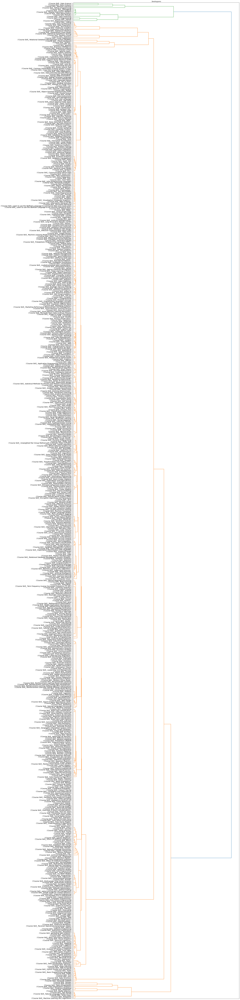

In [103]:
import scipy.cluster.hierarchy as shc
fig = plt.figure(figsize=(50, 200))  
ax1 = fig.add_axes([0.1,0.1,0.4,0.6])
plt.title("Dendrograms")  

dend = shc.dendrogram(shc.linkage(df_university_group_T, method='ward'),orientation='right')
labels = zip(group.columns[dend['leaves']])
ax1.set_xticks([])
ax1.set_yticklabels(labels,{'fontsize': 14})

plt.plot() # supress prints

In [104]:
df_scrapped.head()

Title  \
0  Data Scientist – Intact Lab – Hong Kong Science Park              
1  Data Science Analyst,Customer Analytics/CRM                       
2  Research Data Analyst/Statistician Musculoskeletal Health Re...   
3  Data Scientist Intern                                             
4  Manager Data Analytics                                            

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

# Importance of Project



Based on the 2018 Kaggle Survey, about 40% people in the industry believe that independent projects can demonstrate expertise better than academic achievement. Only less than 10% of people think academic achievement is more important than independent projects. Therefore, we believe that the industry would value more on the practical experiences than just good marks in the courses. Thus, in our program, we would ask the students to do either a 4-month internship or a capstone project to gain hands-on experiences and to demonstrate their abilities.
In addition, in all of our courses, we would encourage the instructors to include a project assignment in the course if possible.

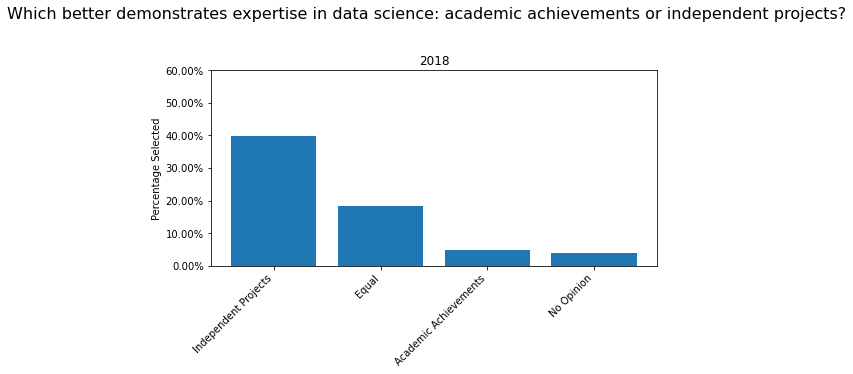

In [105]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which better demonstrates expertise in data science: academic achievements or independent projects?', fontsize=16, y = 1.1)
ax1.bar(df_project.columns, df_project.iloc[0].values)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

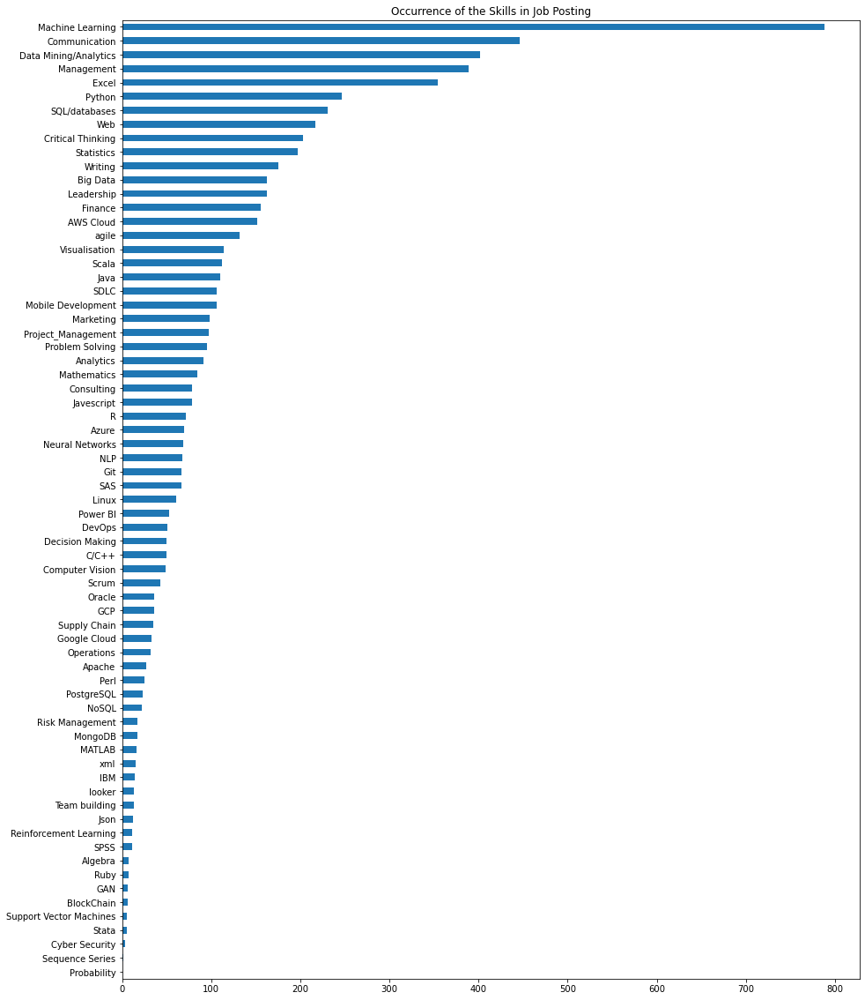

In [106]:
skillsCount = skills_encoded_df.iloc[: , 1:].sum()
plot = skillsCount.sort_values().plot.barh(title = 'Occurrence of the Skills in Job Posting', figsize = (15, 20))

# Course Design

## Course 1: Introduction of Data Science (MIE1624 Cirriculam Update)

The following section will propose an update to the current MIE1624 curriculum according to the data gathered from web scraping job listing, Kaggle surveys, and teaching platforms.


The first half of this course is currently comprised of introduction to computational, mathematical, and statistical tools to be able to build data science models. This will remain to be the same, apart from a few changes as mentioned below.


Python will still be the main programming language used, as seen in the figure below from Kaggle surveyors (python is the most popular). R and SQL will also be introduced and compared with python for data science applications as they are the 2nd and 3rd most popular languages which would be helpful to students to get an exposure. Supporting the Kaggle data, it is also shown by the figure for most common skills taught on Coursera, Python, SQL, and R are the 3 most popular programming languages.



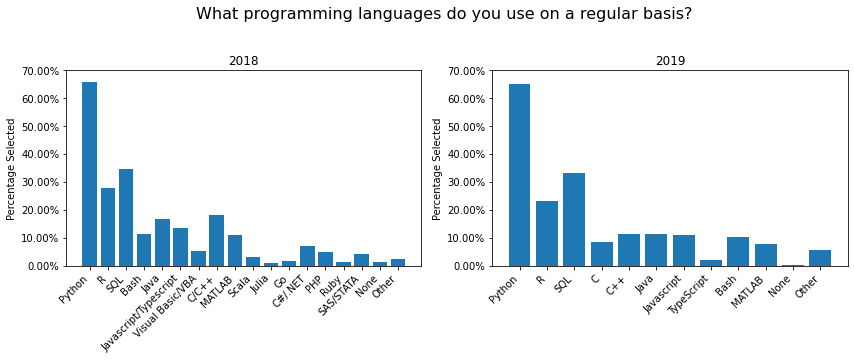

In [107]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('What programming languages do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Programming Language'].index, dict_Kaggle2018['Programming Language'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.7)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Programming Language'].index, dict_Kaggle2019['Programming Language'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.7)
vals = ax1.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

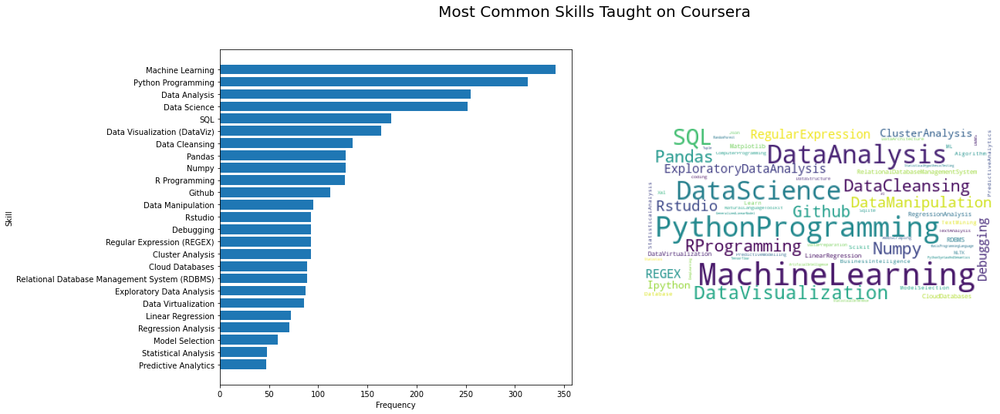

In [108]:
fig, axes = plt.subplots(1,2,figsize=(18,8))
# bar plot of top mentioned hashtags
top = 25
skills_sorted = sorted(skill_counter.keys(), key=lambda x:skill_counter[x], reverse=True)[:top][::-1]
axes[0].barh(skills_sorted, [skill_counter[x] for x in skills_sorted])
axes[0].set_xlabel('Frequency')
axes[0].set_ylabel('Skill')

# word cloud
wcloud = WordCloud(background_color='white',
                   stopwords=['DataViz'],
                   max_words=150,
                   max_font_size=35,
                   random_state=1,
                   collocations=False,
                  ).generate(' '.join(skill_list))
axes[1].imshow(wcloud)
axes[1].axis('off')
plt.suptitle('Most Common Skills Taught on Coursera', fontsize=20)
plt.show()



Basic statistics, linear algebra, and optimization of constrained and unconstrained nonlinear optimization algorithms will still be taught in the course as those are the basic to understand the modelling techniques used for machine learning. 

The main mathematical modelling processes used in the course will be linear and logistic regression. According to the Kaggle surveyors, "linear or logistic regression" is the most popular for Machine Learning algorithms. 

The following algorithms will also briefly be introduced as the Intro to Machine Learning and Deep Learning courses will cover each topic (and other advanced machine learning algorithms) in much more depth. As shown in the Kaggle survey data, these are the most used algorithms, therefore, would be most useful to students wanting to know the basics of data science and analytics. The students can choose to learn further in the subsequent courses (Deep Learning) if they wish to do so. 

    Decision Trees for classification 
    Intro to ensemble learning algorithms such as random forest and gradient boosting 
    Bayesian approaches 
    Convolutional Neural Networks 
    Recurrent Neural Networks 

The figure for most used IDE methods below states that Jupyter notebook is most widely used, thus, the lectures and tutorial examples will continue to be explained with jupyter notebook. However, students can feel free to use any IDE they wish to do so. 

The main update in the course curriculum will be the extended focus on introduction to python to make sure each student is at a comfortable level, extended focus on basic statistics and linear algebra. Linear and logistic regression will also be focused on more since only a few machine learning algorithms will be introduced briefly. Essentially, the current deep learning will be reduced, and more focus will be on the first half of the course.

Each tutorial (weekly basis) will cover the main topic in jupyter notebook of each week's lecture. The tutorial will be focused on application rather than theory. 
  


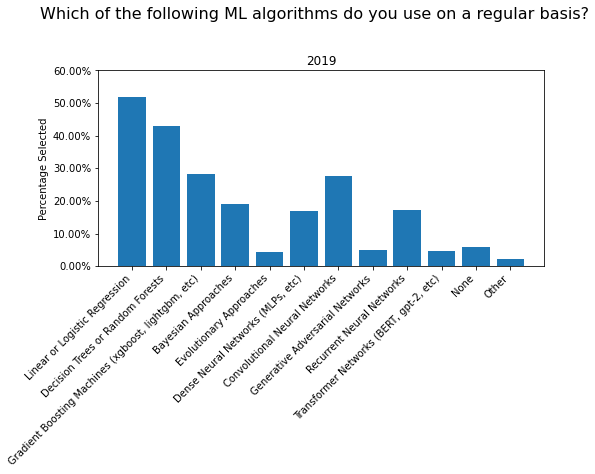

In [109]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which of the following ML algorithms do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2019['ML Algorithm'].index, dict_Kaggle2019['ML Algorithm'].Percent)
ax1.set_title('2019')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

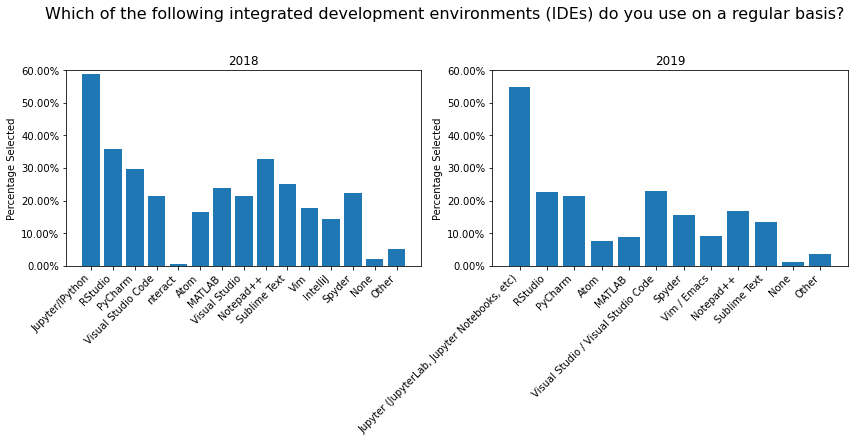

In [110]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following integrated development environments (IDE''s) do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['IDE'].index, dict_Kaggle2018['IDE'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['IDE'].index, dict_Kaggle2019['IDE'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

###Grading Scheme

The grading scheme wil remain the same as of the 2020 course ciriculum apart of some minor differences. 

1. Each individual assignment will requrie students to make a a breif 2-3 minute power point presentation to reinforce their communicationa and presentation skills. As shown in the figure below, acquired from web scraping job postings, "communication is the second more sought for skill in data science and analytics job postings. Therefore, the only way to improve communication is to practice. 
2. The in class group presentation will also stay the same excpet for making it mandatory for each group member to participate 2 minutes each. This is to force students to get out of their comfort zone and practice communicating with other potential co-workers, bosses, etc. 
3. The course project will also remain the same as it enforces communication, and management, which are the top 2 soft/management skills employers are looking for shown in the "Management Skills" plot below. The course project also enforced critical thinking (data analytics), leadership (leading a team), and project mangement (have to meet project deadline, coordinate, etc.)

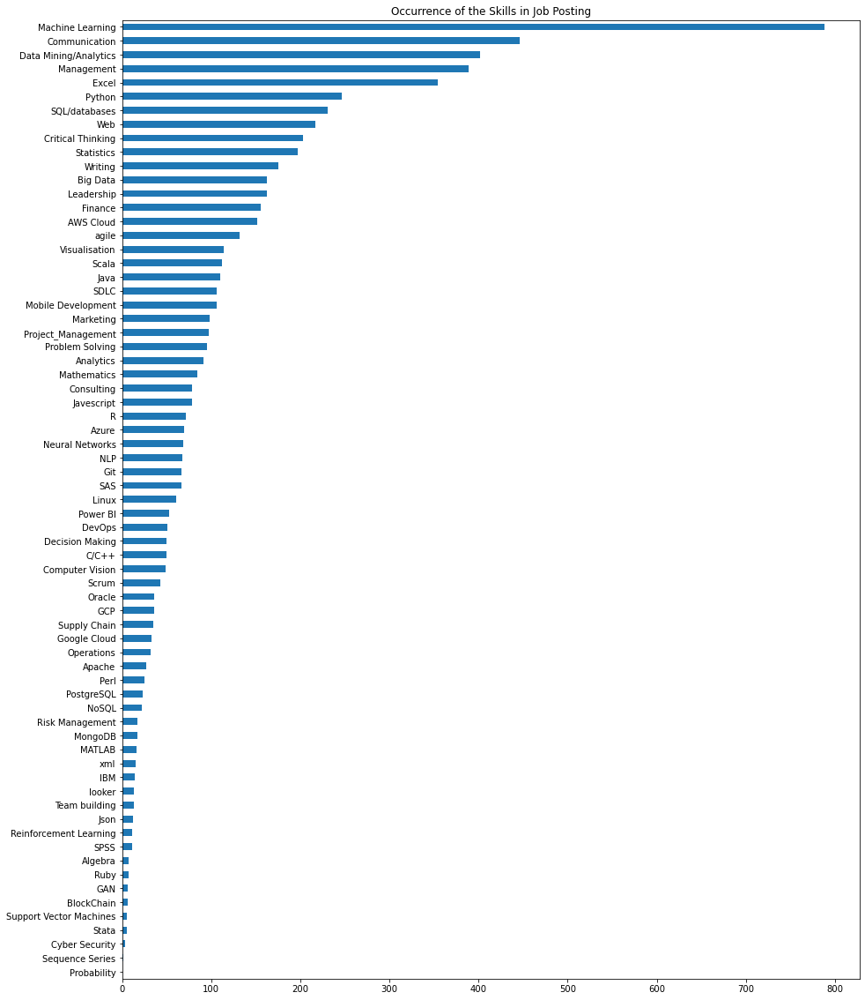

In [111]:
skillsCount = skills_encoded_df.iloc[: , 1:].sum()
plot = skillsCount.sort_values().plot.barh(title = 'Occurrence of the Skills in Job Posting', figsize = (15, 20))

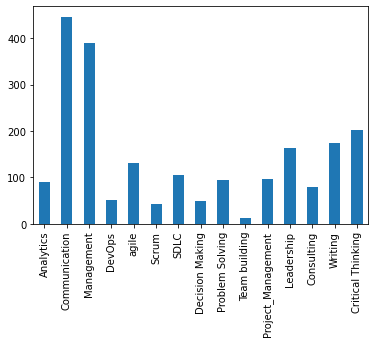

In [112]:
# EDA for Management Skills
df_management = skills_list_df[management].iloc[0,:]
plot = df_management.plot.bar()

## Course 2: Introduction to Machine Learning

**NOTE: From our visualization we can see that Python was one of the popular programming language that is in demand, therefore, this course will be taught using python programming language**

Visualizing Sub all the sub skills used in Machine Learning that were defined in our dictionary

In [ ]:
ml_skill_dict = {}

for index, row in df_scrapped.iterrows():
    
    title = str(row['Title'])
    description = str(row['Description'])
    description = description.lower()
    #print(description)
    #break
    result = {} 
    for term in ml:
        for skill in skills_keywords_dict[term]:
        
            # variable used to store results of the intermediate check (loop below)
            category_found = 0   

            # loop over all skills in the sublist of 'skills_keywords_dict'
            
            skill = skill.lower()

            # if skill from the sublist is found, set 'category_found' to 1
            if skill.lower() in description.lower():
                category_found = 1
                #print(str(index)," ",title," ",term," ",skill)
                break
            if description.find(skill) != -1:
                category_found = 1

        # skill set to 1 if found, 0 if not, in 'results_dict'
        result[skill] = category_found
            
    ml_skill_dict[title] = result



In [ ]:
ml_skills_encoded_df = pd.DataFrame(ml_skill_dict).T.reset_index()
ml_skills_encoded_df.replace(np.nan,0)
ml_skills_encoded_df.head(2)

In [ ]:
ml_skillsCount = ml_skills_encoded_df.iloc[: , 1:].sum()
plot = ml_skillsCount.sort_values().plot.barh(title = 'Occurrence of the Skills in Job Posting', figsize = (13, 13))

Re-visualizing Kaggle Data

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which of the following machine learning frameworks do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['ML Framework'].index, dict_Kaggle2018['ML Framework'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.6)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['ML Framework'].index, dict_Kaggle2019['ML Framework'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.6)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

We can see that Scikit Learn, Tensorflow, Keras and Pytorch are popular frameworks. Since Scikit Learn is the highest in demand the Machine Learning Course should be designed using Scikit Learn.

Additionally, introduction to Tensorflow and Pytorch can be provided to students during tutorial. Since all three frameworks use python, they align with our teaching framework as well.

In [ ]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.set_figheight(10)
fig.suptitle('Which of the following ML algorithms do you use on a regular basis?')
ax1.barh(dict_Kaggle2019['ML Algorithm'].index, dict_Kaggle2019['ML Algorithm'].Percent)
ax1.set_title('2019')
ax1.set_xlim(0, 0.6)
#fig.autofmt_xdate(rotation=90)

From the ML Algorithm plot above we can see that Linear/Logistic Regression are utilized by maximum number of people in the industry followed by Decision Tree. Additionally CNNs, DNN, Bayesian approach are very popular therefore, they should be introduced in this course. However, implementation of advance algorithm such as CNN, NLP, GAN, etc. can be reserved for the second course. Deep Learning., GAN, etc. can be reserved for the second course. Deep Learning. 

In [ ]:
fig, (ax1, ax2) = plt.subplots(2,1)
fig.set_figheight(25)
fig.suptitle('Which of the following machine learning products do you use on a regular basis?')
ax1.barh(dict_Kaggle2018['ML Product'].index, dict_Kaggle2018['ML Product'].Percent)
ax1.set_title('2018')

ax1.set_xlim(0, 0.3)
ax2.barh(dict_Kaggle2019['ML Product'].index, dict_Kaggle2019['ML Product'].Percent)
ax2.set_title('2019')

ax2.set_xlim(0, 0.3)
fig.autofmt_xdate(rotation=45)


For the Machine Learning Course Design we will looking at the visualizations for Kaggle 2018, Kaggle 2019, Coursera and University Data collected.


From all the University and Coursera Visualization we can see that Machine Learning is an important and popular course that should be taught at the university as our competitors are teaching it. The Kaggle Data also verifies this as we can see answers to machine learning related questions.


Since Kaggle data is collected from industry experts using that as a reference and using web scrapped data we can design the course as following. Addition to the data visualized using our experience we can refer to more detailed course design.


**Prerequisite:** Statistics, probability theory and Linear Algebra in Undergrad(as Machine Learning is a very Math heavy Course)
Exception: Students taking any Statistics/Linear Algebra Course.

#### Machine Learning Topics To be Covered:


* Regression 
        * Linear Regression
        * Logistic Regression
        * Ridge Regression
        * Linear classification
        * Gradient Descent
* Tree 
        * Decision Tree
        * Random Forest
        * Ensemble
* Support Vector Machine
* Optimization
* Hyperparameter optimization

* Unsupervised learning
        * Principle Component Analysis 
        * K-Means 

#### Advance Topics
* Monte Carlo simulations
* Introduction to Neural Network 
* Introduction to Convolution Network
* Introduction to Reinforcement Learning


#### Tutorial
* Python introduction
* Statistics Review
* Linear Algebra Review
* Tensorflow and Pytorch basics


## Course 3: Introduction to Deep Learning

This course will build on top of Introduction to Machine Learning course. Here More Advance Topics will be discussed and Taught such as Convolution Neural Network, Recurrent Neural Network, Etc

In [ ]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.set_figheight(10)
fig.suptitle('Which of the following ML algorithms do you use on a regular basis?')
ax1.barh(dict_Kaggle2019['ML Algorithm'].index, dict_Kaggle2019['ML Algorithm'].Percent)
ax1.set_title('2019')
ax1.set_xlim(0, 0.6)
#fig.autofmt_xdate(rotation=90)

Using the Visualizations presented in introduction to Machine Learning Course we will use that to design his course.<br>

For the popular machine learning algorithms in 2019 (from Kaggle dataset) we can see that the following advance algorithms are very popular:
* Dense Neural Network
* Recurrent Neural Network
* Convolution Neural Network
* Generative Adversarial networks
<br>

Therefore these algorithms will be designed to be included in theses course. 
<br>
From the Popular ML Framework graphs we can see that Tensorflow and Keras are popular after Scikit learn. Since Tensorflow and Keras frame work make it easy to build Neural network models this course will use Tensorflow with Keras API.
<br>
This course will also teach basic implementation in Computer Vision and perception
<br>
**Prerequisite:** <li> Students are recommended to take Introduction to Machine Learning course before taking this course. Else additional readings and extra work from student will be required to complete the course. 
<li> Python Programming - Familiar to Tensorflow will be beneficial but not required.
<li> Previous course in calculus, linear algebra, and statistics.
<br>    


#### Deep Learning Corse Design


* Introduction and Neural Networks
        * Review of Linear Model (Linear Regression, Logistic Regression)
        * Neural Networks Basics
        * Shallow and Deep Neural Networks
        * Feedforward and Back Propagation in Neural Network
        * Optimization, Hyper Parameter Tuning
        
* Convolution Networks and Computer Vision 
        * Fundamentals of Convolution Neural Networks
        * Deep Convolution Neural Networks 
        * Computer Vision (Object Detection and Image Classification)
        
* Recurrent Networks and Natural Language Processing
        * Introduction to recurrent Neural Networks
        * Sequence Modelling
        * Natural Language Processing (with Sequence model and Attention models)
        
* Autoregressive and Reversible Models

* Introduction to Generative Adversarial Network

* Auto-Encoder and Decoders

* Attention Models


#### Additional Topics
* Reinforcement Learning
    * Q-Learning
    * Fuzzy Networks    

#### Tutorial
* Tensorflow Programming
* Applying Neural Network with Tensorflow
* Applying Convolution Neural Network
* Introduction to popular Detection Algorithm (Yolo)
* Building LSTM and RNN NLP models
* Reinforcement Learning model 


## Course 4: Statistical Analysis: Hypothesis test

Statistics (and probability) is a key part of data science, where it can be used in exploratory data analysis, bias reduction, estimation of outcomes, etc. Statistical Analysis is one of the top 20 skills taught in Machine learning and Data Science on Coursera. 

The course is split into two parts, each includes several sub topics: 
* Statistics
        * Estimation and Assessing Theories
        * Construct Confidence Intervals
        * Interpret Inferential Results
        * Apply More Advanced Statistical Modeling Procedures
* Data Analytics
        * Where Data Comes From
        * What Types of Data Can Be Collected
        * Study Data Design
        * Data management
        * How to Effectively Carry Out Data Exploration and Visualization

## Course 5: Big Data

In the Kaggle Survey, over 20% of people never used any Big Data product, but in the job posting, big data is still one of the top skills required. Thus, we design Bid Data as a core course.

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figwidth(14)
fig.suptitle('Which specific big data/analytics products do you use on a regular basis?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Big Data Product'].index, dict_Kaggle2018['Big Data Product'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.3)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
ax2.bar(dict_Kaggle2019['Big Data Product'].index, dict_Kaggle2019['Big Data Product'].Percent)
ax2.set_title('2019')
ax2.set_ylim(0, 0.3)
vals = ax2.get_yticks()
ax2.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax2.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

In [ ]:
skillsCount = skills_encoded_df.iloc[: , 1:].sum()
plot = skillsCount.sort_values().plot.barh(title = 'Occurrence of the Skills in Job Posting', figsize = (15, 20))

As Big Data is a subject with involves a large range of skills, to design the best course, we looked into some other big data courses online with high ratings.
* The Ultimate Hands-On Hadoop: Tame your Big Data! https://www.udemy.com/course/the-ultimate-hands-on-hadoop-tame-your-big-data/
* Big Data Specialization https://www.coursera.org/specializations/big-data#courses

The Big Data course would provide a thorough understanding of Big Data, which would cover many concepts and technologies related to Big Data.

Big Data Topics To be Covered:
* Big Data Infrastructure
        * Hadoop Cluster
        * HDFS and MapReduce
        * Resource Management with Yarn 
* Big Data Storage and Querying
        * SQL
        * Hive
* Machine Learning With Big Data
        * Spark: PySpark
* Streaming Data in Real Time 
        * Kafka
        * Spark Streaming

Additional Topics
  * NoSQL Database
  * Programming in Scala

## Course 6: Professional Communication and Leadership


**Course Description**: Critical thinking, communication and leadership all become essential skills of the data science jobs. Critical thinking enables us to avoid common obstacles, test our beliefs and assumptions, and correct distortions in our thought processes. Communication allows us to deliver our ideas powerfully in the workplace. Leadership is essential for managing, inspiring, and leading your team to achieve greater success. This course is designed to teach you those communication, leadership, and other soft skills, which are beneficial for your professional career. 

**Course Goals & Learning Outcomes:** Students will learn essential leadership skills, including how to inspire and motivate individuals, manage talent, influence without authority, and lead teams. They will learn how to communicate effectively in English in professional contexts, by formulating and communicating your thoughts and ideas more clearly, in both written and speaking. They will also learn how to use analysis, synthesis, and positive inquiry to address individual and organizational problems and develop the critical thinking skills needed in today’s turbulent times.

**Reasoning**: Based on the web-scraped data for management skills, we can see that soft skills such as Communication and Decision Making are also required by the data science jobs. Since this is a technical- and business-oriented program, those skills should also be included as a core course.

In [ ]:
# EDA for Management Skills
df_management = skills_list_df[management].iloc[0,:]
plot = df_management.plot.bar()

# Elective Courses

## Course 7: Project Magnagement




**Course Description**: This course will introduce the students to key functional areas of management and the typical decisions they face. It will illustrate how each functional area approaches some common managerial problems, and where data and analytics may be usefully employed. It’s designed to ensure all students from all backgrounds or experience are equipped to place the management of AI, data science, and data analytics in the context of general business management. This course is for aspiring data science professionals who want to learn complete methodology without having to learn coding or technical topics. 

**Course Goals & Learning Outcomes:**
Plan end to end data science projects including activities involved, dependencies, external/internal recourse needs and skills 
Manage data science teams and ensure alignment to a larger project/program objectives while managing stakeholder expectations on the delivery of data science projects
Plan communications on status reporting of data science projects with details of all activities

**Reasoning**: Based on the web-scraped data for technical skills, in particular management skills, the most common skills are shown below. It can be seen communication and basic management skills are among the top most valued skills in industry. Critical thinking, writing, and leadership skills are also among the top 5 skills. Therefore, an elective course, Introduction to Project Management in Data Science, is included in the Masters program to expose students of the required management skills that would equip them with valuable skills to be successful in the industry. 

This course is also for students and professionals who know how to code and need to learn the complete project management methodology. As shown by the hierarchical cluster on job skills, it can be seen that “Project Management” is grouped with problem solving, analytics, visualization, marketing,  agile, finance, big data, and leadership. This means that the students should already have an overview of the basic data science and analytic skills, and those skills will be used in project management applications which are all interrelated as shown by the cluster. 

In [ ]:
# EDA for Management Skills
df_management = skills_list_df[management].iloc[0,:]
plot = df_management.plot.bar()

## Course 8: Data Science Programming Basics


From the skills gained from the job postings, we show that Python, Excel and SQL are the top ones. We understand that most students entering this Master’s program have learned these skills before. However, we believe that students with a Bachelor in Management or Art Faculties would be also interested in coming to our Master’s program.

This course is designed for students who entered in the program with none or very minimal background in data analysis. The course is a practical course that introduces basic data analysis skills and tools including Python(Numpy, Pandas), Excel(VBA) and SQL. The first topic will be Python as it is widely  used in other courses.

## Course 9: Advanced Data Analysis: Image, Audio and Video Analysis

From the Kaggle Survey, we found that people would often handle Numerical, Tabular, Time-Series and Text Data in their daily practice. These data types would be covered in our core course. Besides, about 25% of people would often interact with Image Data, and nearly 10% of people would interact with Video Data. Thus, we design it as an elective.

In [ ]:
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('Which types of data do you currently interact with most often at work or school?', fontsize=16, y = 1.1)
ax1.bar(dict_Kaggle2018['Data Type'].index, dict_Kaggle2018['Data Type'].Percent)
ax1.set_title('2018')
ax1.set_ylim(0, 0.5)
vals = ax1.get_yticks()
ax1.set_yticklabels(['{:,.2%}'.format(x) for x in vals])
ax1.set_ylabel('Percentage Selected')
fig.autofmt_xdate(rotation=45)

## Course 10: Full Stack Development

This course should provide an introduction to full-stack app development. This course combines lectures and hands-on open-ending programming assignments to expose the students to the most popular Android app development tools. Previous programming experience is a prerequisite for this course. This course chose to develop an Android app instead of a website because mobile and wearable devices, combined with web-based software, have given rise to an explosion in creativity and possibility.

**Reasoning**



*   Having full-stack development experience would be precious no matter what kind of technical positions are inquired.

*   An important usage of data science and data analysis is to analyze user data and improve the application’s performance, which is a part of full-stack development.

*   Most of the full-stack development(especially mobile app development) related skills are shown in the top 20 of the required skills listing in Job Posting

![picture](https://drive.google.com/uc?id=1BhfRufCboLcQfT9yEHifsCPCzhqGtC0n)



## Course 11: Operation Research

**Course Description**: Operations Research is a well-defined field of study involving mathematics, computer modeling and optimization. It is one of the various disciplines used in the emerging interdisciplinary field of study of Data Science. This course aims to introduce optimization techniques applicable in solving various engineering problems. These techniques are widely used in engineering design, optimal control, production planning, reliability engineering, and operations management.

**Reasoning**: Operations (Research) is one of the common skills in the data science jobs as shown on the dendrogram. Python or other computer languages can be useful tools for creating mathematical models and solving optimization problems. However, it was not a popular skill for all data science jobs, hence made as an elective option.

## Course 12: Introduction to Computational Finance

Based on the skills occured in job posting, Finance is one of top skills needed in the market. Even though not everyone would work in the Financial Sector, we believe having a Finance course as elective is nessecary.

The objective of the course is to introduce students to use mathematical models and numerical techniques in finance. Thus, this course will over both financial economics topics and the relevant mathematical/statistical topics.


## Course 13:Business Intelligence

As Tableau is in high demand for management jobs, we would like to design a course to allow the student to use Tableau and learn the essential skills to become a BI analyst.

This course would provide students the skills they need to become a BI Analyst. The topics would include how to Use data for improved business decision-making, present information in the form of metrics, KPIs, reports, and dashboard, and analyze current and historical data to find trends, market conditions, and research competitor positioning. This course would also introduce the students how to use Tableau for visualization and dashboard. 



# Internship Companies

As an Education Startup, we would try to help students to find there desired intership. First, we analyzed which industry requires the most data analysis/scientist using the Kaggle data. Then we find the companies that curretly hiring interns and match the companies with the industried. Thus, we will be able to recommand the internship oppotunities to the students. 

In [ ]:
# Q7 in 2018 asked the industry peoplw work in
fig, ax1 = plt.subplots(1, 1)
fig.set_figwidth(8)
fig.suptitle('In what industry is your current employer/contract?', fontsize=16, y = 1.1)
ax1.bar(ds_industry.index, ds_industry)
ax1.set_title('2018')
vals = ax1.get_yticks()
ax1.set_ylabel('Count')
fig.autofmt_xdate(rotation=45)

#### Companies Hiring Intern

In [ ]:
df_Indeed.head(1)

In [ ]:
df_LinkedIn.head(1)

In [ ]:
# Extracting the titles and decription column from linkedIn and Indeed data
df_intern_1 = df_Indeed[['Title','Company' ,'Description']]
print(df_intern_1.count())
df_intern_2 = df_LinkedIn[['Post','Company Name','Description']]
print(df_intern_2.count())
df_intern_2.rename(columns = {'Post': 'Title','Company Name':'Company'}, inplace = True)

# Combining the extracted data frame into one data frame
df_intern_all = pd.concat([df_intern_1, df_intern_2], axis=0)
df_intern_all.count()

In [ ]:
df_intern_all.dropna(subset = ['Company'], inplace = True)
#df_intern_all.head(1)

In [ ]:
#extracting Dataframe for Internship and Summer Jobs
intern_roles = ['intern' ,'internship' , 'co-op','coop','student','summer']
df_intern_all_top = df_intern_all[ df_intern_all['Title'].astype(str).str.lower().str.contains('|'.join(intern_roles))]

# Extracting all intern and summer roles/titles
intern_roles_company = df_intern_all_top['Company'].tolist()

print(df_intern_all_top.shape)

In [ ]:
df_intern_all_top['Company'].unique

In [ ]:
# word cloud
plt.figure(figsize = (10, 10), facecolor = None) 
wcloud = WordCloud(background_color='white',
                   stopwords=['DataViz'],
                   max_words=150,
                   max_font_size=35,
                   random_state=1,
                   collocations=False,
                  ).generate(''.join(str(intern_roles_company)))
plt.imshow(wcloud)
#plt.axis('off')
plt.title('Top 150 Companies Offering Internship', fontsize=20)
plt.show()

In [ ]:

# word cloud
plt.figure(figsize = (10, 10), facecolor = None) 
wcloud = WordCloud(background_color='black',
                   stopwords=['DataViz'],
                   max_words=15,
                   max_font_size=35,
                   random_state=1,
                   collocations=False
                  ).generate(''.join(str(intern_roles_company)))
plt.imshow(wcloud)
#plt.axis('off')
plt.title('Top 15 Companies Offering Internship', fontsize=20)
plt.show()

In [ ]:
df_intern_all_top.groupby('Company')['Company'].count().nlargest(25).index